## <a id = '0'> Índice </a>

* [**Entorno**](#1)  
   * [Librerías](#1d1)  
   * [Funciones](#1d2)  
   * [Constantes](#1d3)

* [**Análisis de cross-correlation**](#3)
   * [Análisis series originales](#3d1)
      * [Análisis de cross-correlation series originales](#3d1d1)
      * [Análisis de cross-correlation de series originales con intervalos de desviación estándar](#3d1d2)
      * [Análisis de cross-correlation promedio de series con intervalos de desviación estándar](#3d1d3)
   
   * [Análisis promedio de series](#3d2)
      * [Promedio de series con intervalos de desviación estándar](#3d2d1)
      * [Promedio de series con suavizamiento (window 50) e intervalos de desviación estándar](#3d2d2)
      * [Análisis de cross-correlation del promedio de series con suavizamiento (window 50) e intervalos de desviación estándar](#3d2d3)

   * [Análisis de cross-correlation window particular](#3d3)
      * [Análisis de series de Cara Lateral con ventana (window) particular](#3d3d1)
         * [Análisis de series con ventana (window) particular Cara Lateral](#3d3d1d1)
         * [Análisis de cross-correlation con ventana (window) particular Cara Lateral](#3d3d1d2)

      * [Análisis de series de Cara Anterior con ventana (window) particular](#3d3d2)
         * [Análisis de series con ventana (window) particular Cara Anterior](#3d3d2d1)
         * [Análisis de cross-correlation con ventana (window) particular Cara Anterior](#3d3d2d2)

      * [Análisis de series de Cara Interior con ventana (window) particular](#3d3d3)
         * [Análisis de series con ventana (window) particular Cara Interior](#3d3d3d1)
         * [Análisis de cross-correlation con ventana (window) particular Cara Interior](#3d3d3d2)

      * [Análisis de series de Cara Sepal con ventana (window) particular](#3d3d4)
         * [Análisis de series con ventana (window) particular Cara Sepal](#3d3d4d1)
         * [Análisis de cross-correlation con ventana (window) particular Cara Sepal](#3d3d4d2)

   * [Análisis de cross-correlation con ventana (window) promedio](#3d4)
      * [Análisis de series de Cara Lateral con ventana (window) de promedio](#3d4d1)
         * [Análisis de series con ventana (window) promedio Cara Lateral](#3d4d1d1)
         * [Análisis de cross-correlation con ventana (window) promedio Cara Lateral](#3d4d1d2)

      * [Análisis de series de Cara Anterior con ventana (window) de promedio](#3d4d2)
         * [Análisis de series con ventana (window) promedio Cara Anterior](#3d4d2d1)
         * [Análisis de cross-correlation con ventana (window) promedio Cara Anterior](#3d4d2d2)

      * [Análisis de series de Cara Interior con ventana (window) de promedio](#3d4d3)
         * [Análisis de series con ventana (window) promedio Cara Interior](#3d4d3d1)
         * [Análisis de cross-correlation con ventana (window) promedio Cara Interior](#3d4d3d2)

      * [Análisis de series de Cara Sepal con ventana (window) de promedio](#3d4d4)
         * [Análisis de series con ventana (window) promedio Cara Sepal](#3d4d4d1)
         * [Análisis de cross-correlation con ventana (window) promedio Cara Sepal](#3d4d4d2)


## <a id = '1'> Entorno </a>
[índice](#0)

### <a id = '1d1'> Librerías </a>

In [1]:
import os
import pandas as pd
import numpy as np

from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox

from statsmodels.tsa.arima.model import ARIMA

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX

from scipy.stats import ks_2samp, pearsonr, spearmanr
from statsmodels.tsa.stattools import coint
from scipy.signal import find_peaks

import matplotlib.pyplot as plt

import math
import itertools
# from config import data_folder

In [2]:
os.chdir("../")

### <a id = '1d2'> Funciones </a>

In [3]:
from src.utils import *

### <a id = '1d3'> Constantes </a>

In [4]:
from config.cons import data_folder, cara_lateral, cara_anterior, cara_interior, cara_sepal, list_signals, window_jason

## <a id = '2'> Lectura de datos </a>
[índice](#0)

In [5]:
proyect_path = os.getcwd()
data_path = proyect_path + data_folder

In [6]:
lateral_combinaciones = list(itertools.combinations(cara_lateral, 2))
anterior_combinaciones = list(itertools.combinations(cara_anterior, 2))
interior_combinaciones = list(itertools.combinations(cara_interior, 2))
sepal_combinaciones = list(itertools.combinations(cara_sepal, 2))

In [7]:
df_all = lectura_carpetas_dict(data_path)

In [8]:
df_mi = df_all["mi"]
df_sttc_mi = df_all["sttc_mi"]
df_sttc = df_all["sttc"]
df_other = df_all["other"]

In [9]:
#Lectura de windows
import json
with open(window_jason, "r") as file:
    dict_data_jump = json.load(file)  

## <a id = '3'>  Análisis Cross Correlation </a>
[índice](#0)

In [10]:
df_mi_smooth = dict_apply_smooth(df_mi, list_signals)
df_sttc_mi_smooth = dict_apply_smooth(df_sttc_mi, list_signals)
df_sttc_smooth = dict_apply_smooth(df_sttc, list_signals)
df_other_smooth = dict_apply_smooth(df_other, list_signals)

In [11]:
df_mi_ccf = genera_dict_comb_ccf(df_mi, lateral_combinaciones)
df_sttc_mi_ccf = genera_dict_comb_ccf(df_sttc_mi, lateral_combinaciones)
df_sttc_ccf = genera_dict_comb_ccf(df_sttc, lateral_combinaciones)
df_other_ccf = genera_dict_comb_ccf(df_other, lateral_combinaciones)

In [12]:
df_mi_smooth_ccf = genera_dict_comb_ccf(df_mi_smooth, lateral_combinaciones)
df_sttc_mi_smooth_ccf = genera_dict_comb_ccf(df_sttc_mi_smooth, lateral_combinaciones)
df_sttc_smooth_ccf = genera_dict_comb_ccf(df_sttc_smooth, lateral_combinaciones)
df_other_smooth_ccf = genera_dict_comb_ccf(df_other_smooth, lateral_combinaciones)

In [13]:
df_mi_stats = get_estadistica_dict(df_mi, cara_lateral)
df_sttc_mi_stats = get_estadistica_dict(df_sttc_mi, cara_lateral)
df_sttc_stats = get_estadistica_dict(df_sttc, cara_lateral)
df_other_stats = get_estadistica_dict(df_other, cara_lateral)

In [14]:
df_mi_smooth_stats = get_estadistica_dict(df_mi_smooth, cara_lateral)
df_sttc_mi_smooth_stats = get_estadistica_dict(df_sttc_mi_smooth, cara_lateral)
df_sttc_smooth_stats = get_estadistica_dict(df_sttc_smooth, cara_lateral)
df_other_smooth_stats = get_estadistica_dict(df_other_smooth, cara_lateral)

In [15]:
df_mi_ccf_stats = get_estadistica_label_dict(df_mi_smooth_ccf, lateral_combinaciones)
df_sttc_mi_ccf_stats = get_estadistica_label_dict(df_sttc_mi_smooth_ccf, lateral_combinaciones)
df_sttc_ccf_stats = get_estadistica_label_dict(df_sttc_smooth_ccf, lateral_combinaciones)
df_other_ccf_stats = get_estadistica_label_dict(df_other_smooth_ccf, lateral_combinaciones)

In [20]:
df_mi_ccf = genera_dict_comb_ccf(df_mi, lateral_combinaciones)
df_sttc_mi_ccf = genera_dict_comb_ccf(df_sttc_mi, lateral_combinaciones)
df_sttc_ccf = genera_dict_comb_ccf(df_sttc, lateral_combinaciones)
df_other_ccf = genera_dict_comb_ccf(df_other, lateral_combinaciones)

### <a id = '3d1'>  Análisis series originales </a>
[índice](#0)

#### <a id = '3d1d1'>  Análisis de cross-correlation series originales </a>
[índice](#0)

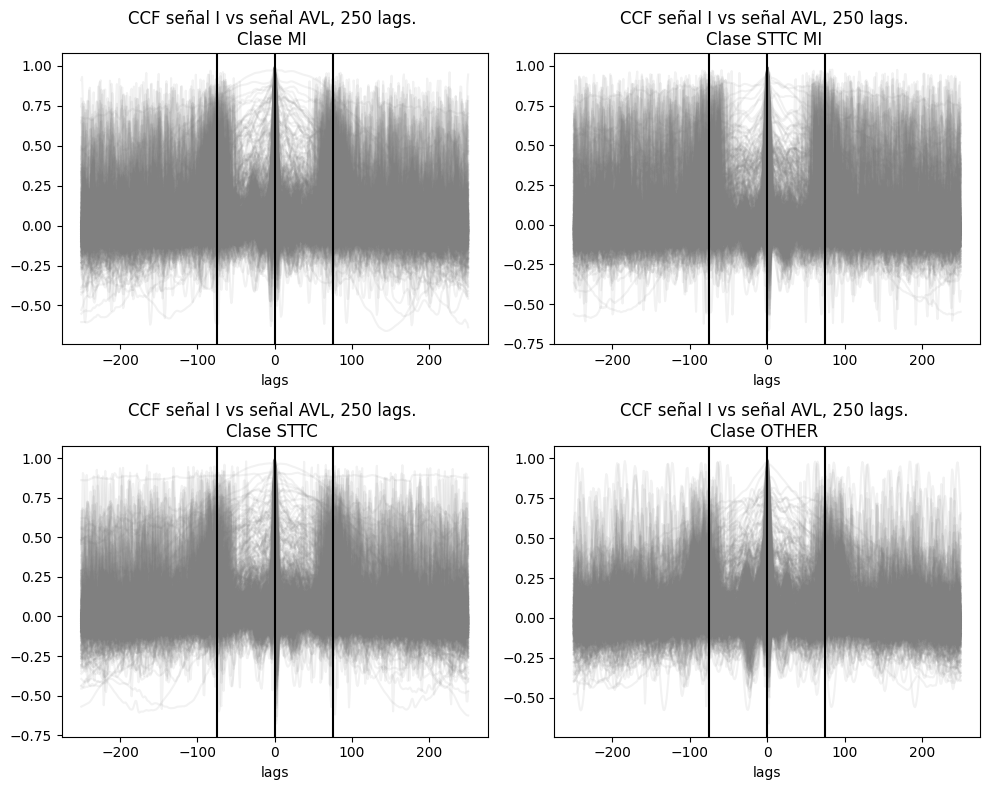

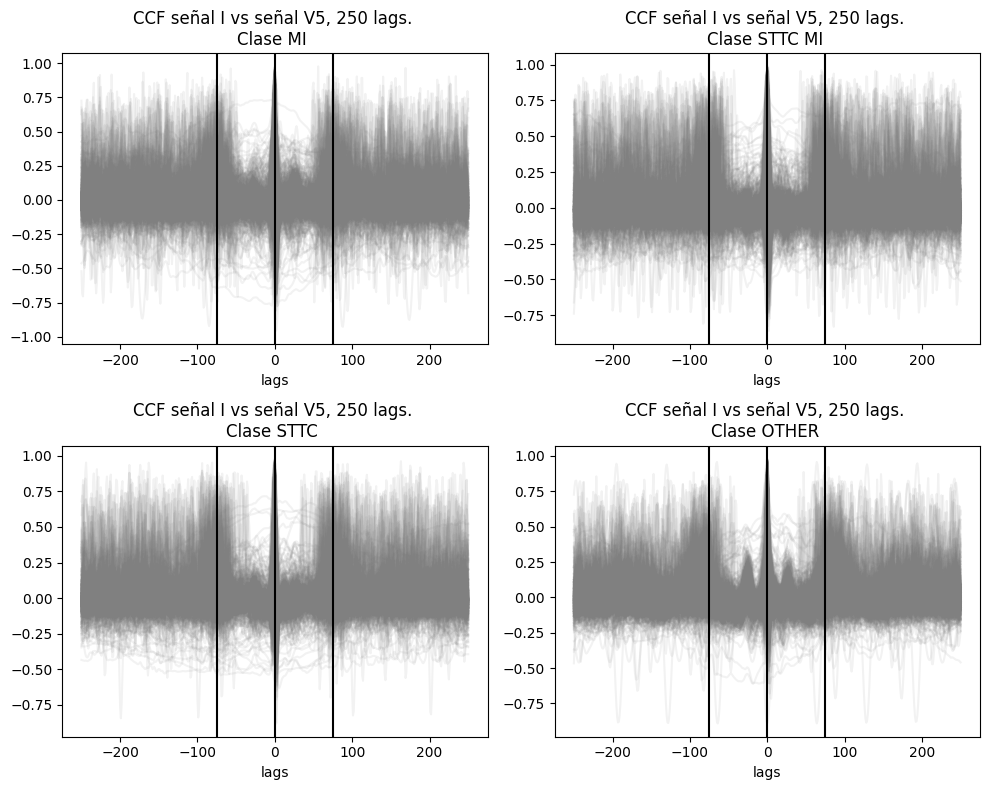

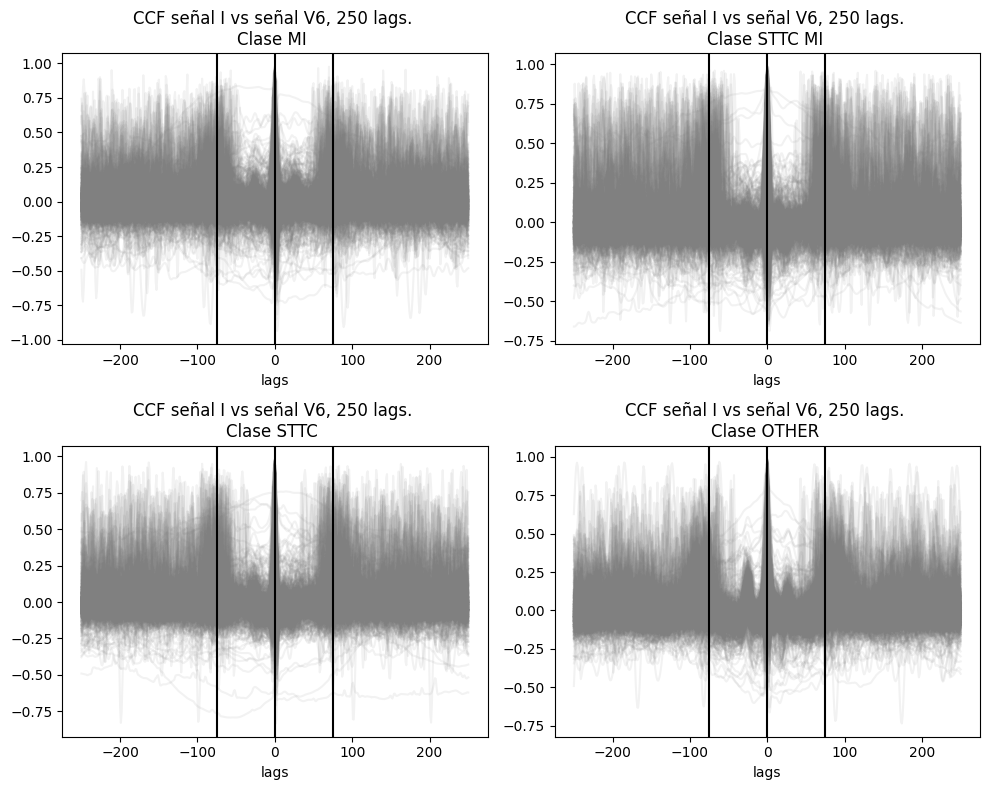

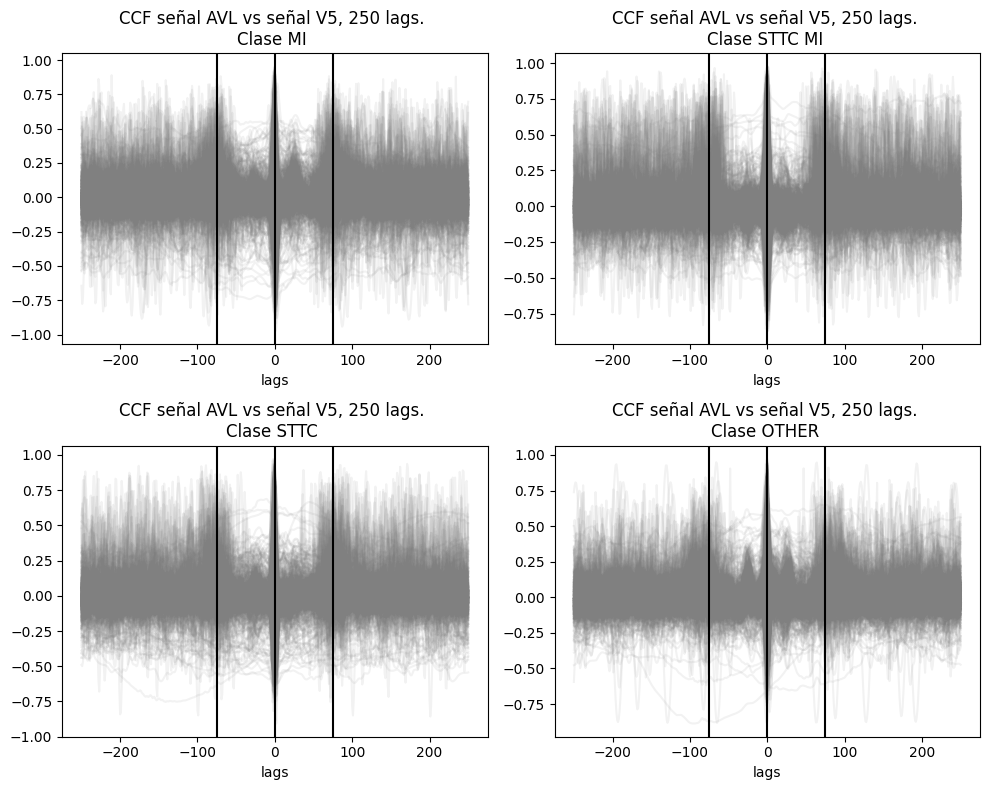

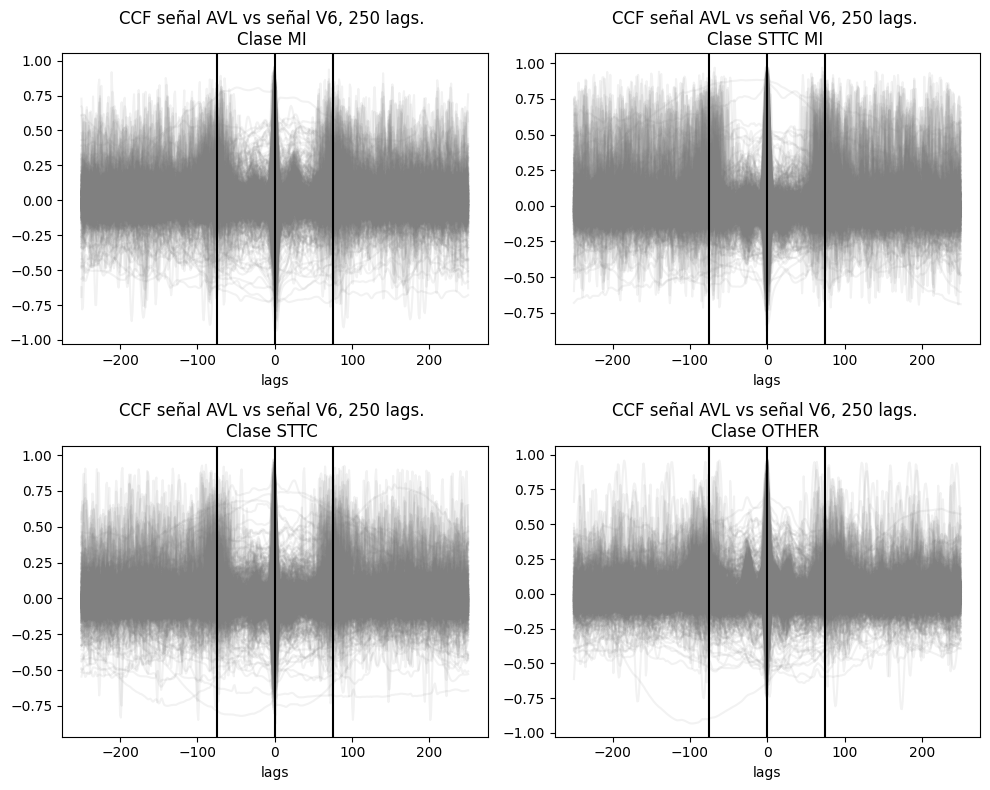

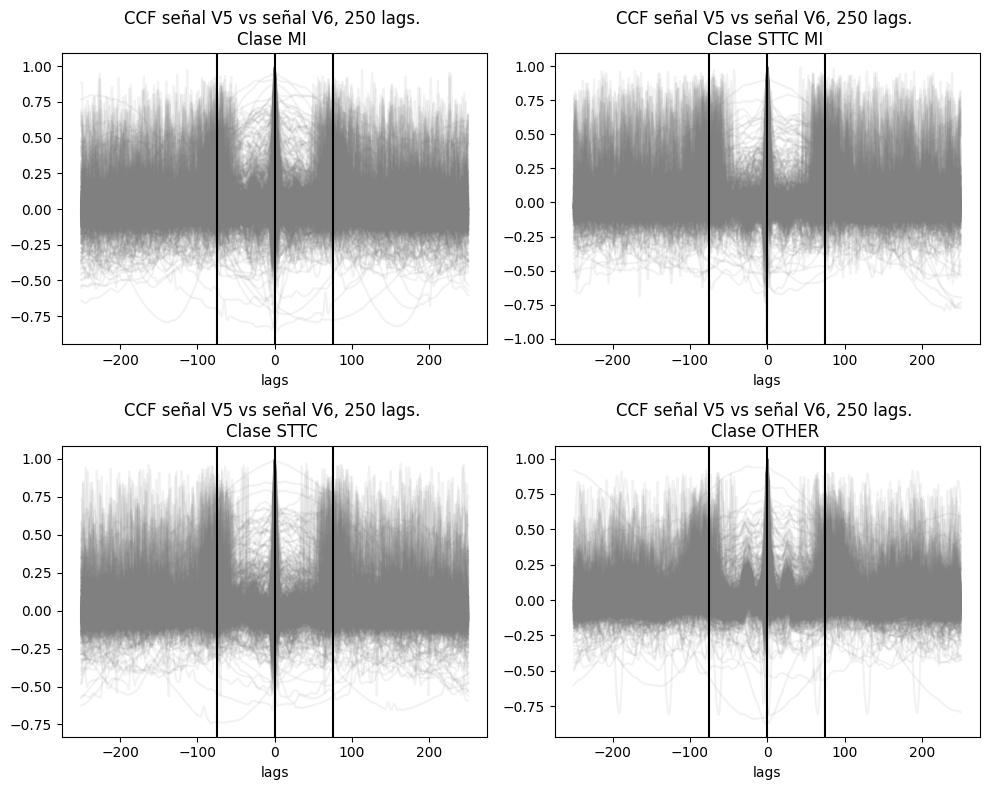

In [16]:
plot_ccf_faces(df_mi_ccf, df_sttc_mi_ccf, df_sttc_ccf, df_other_ccf, 
                   list_signals = lateral_combinaciones)

#### <a id = '3d1d2'>  Análisis de cross-correlation de series originales con intervalo de desviación estándar </a>
[índice](#0)

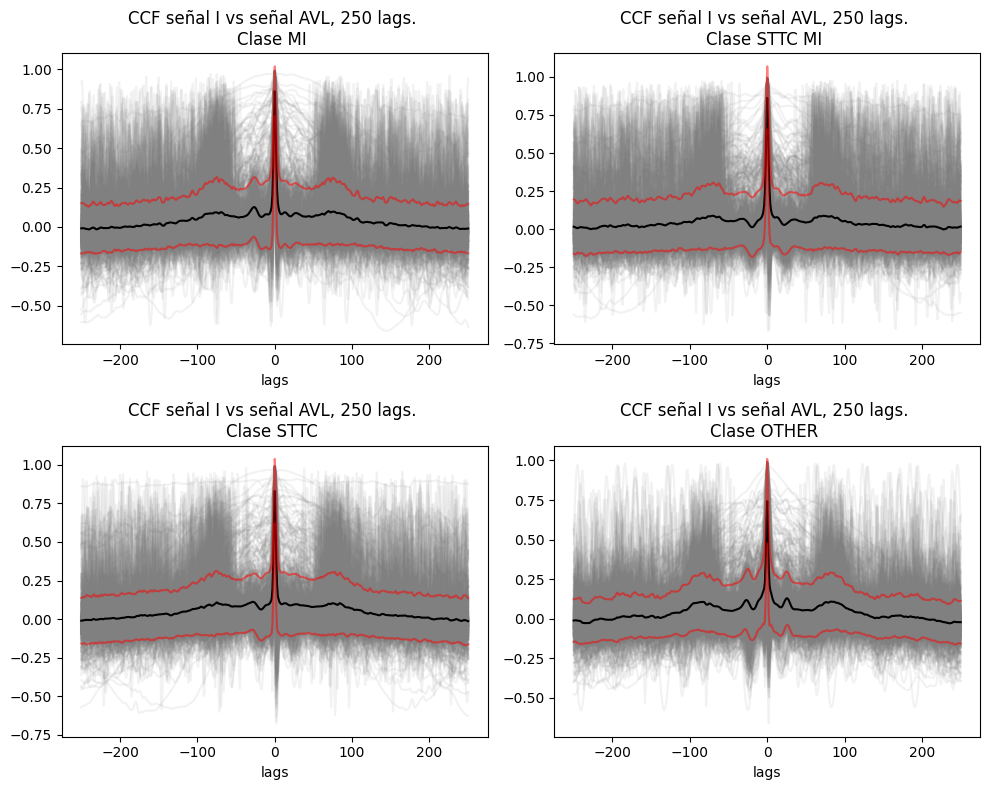

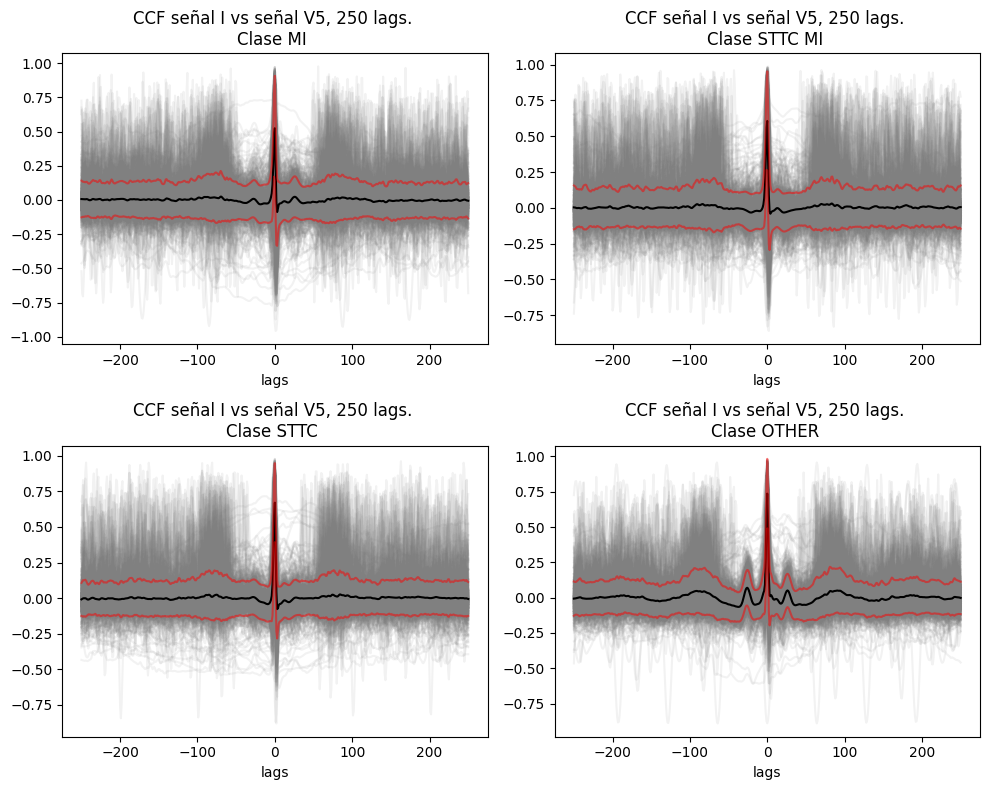

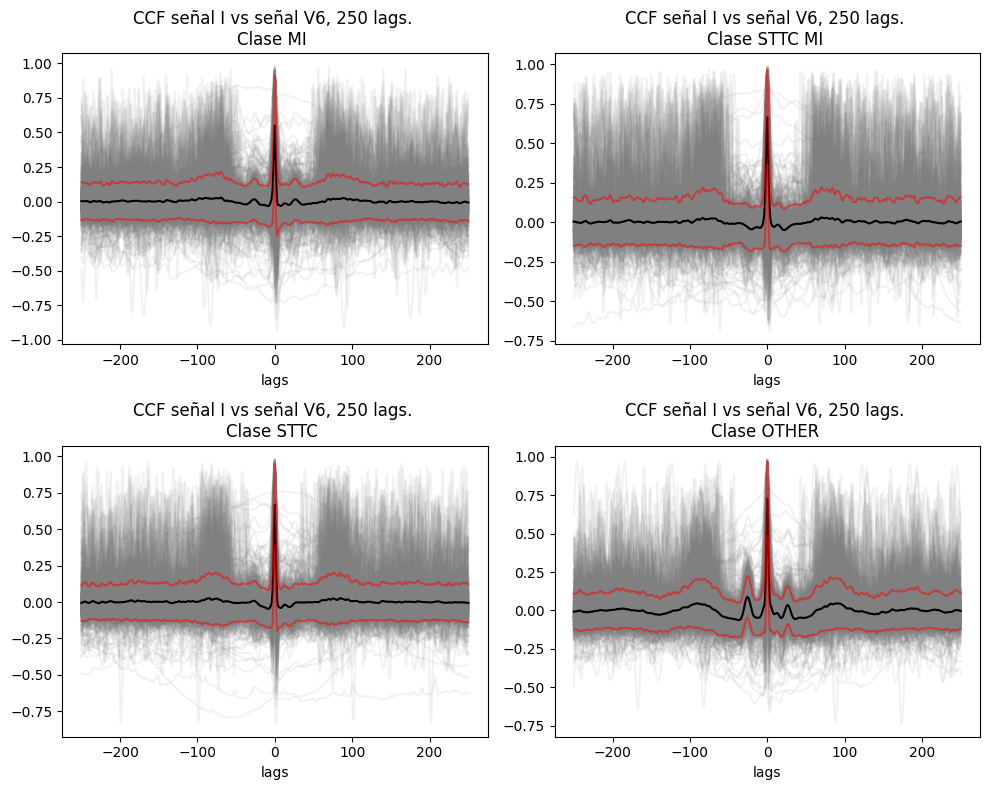

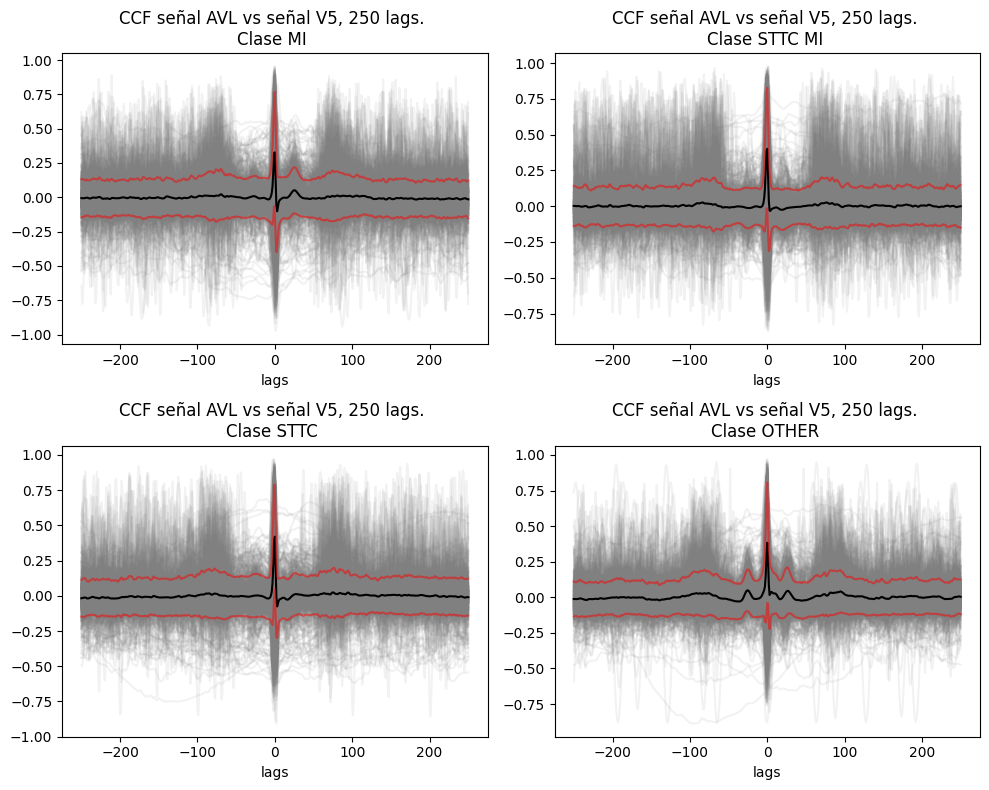

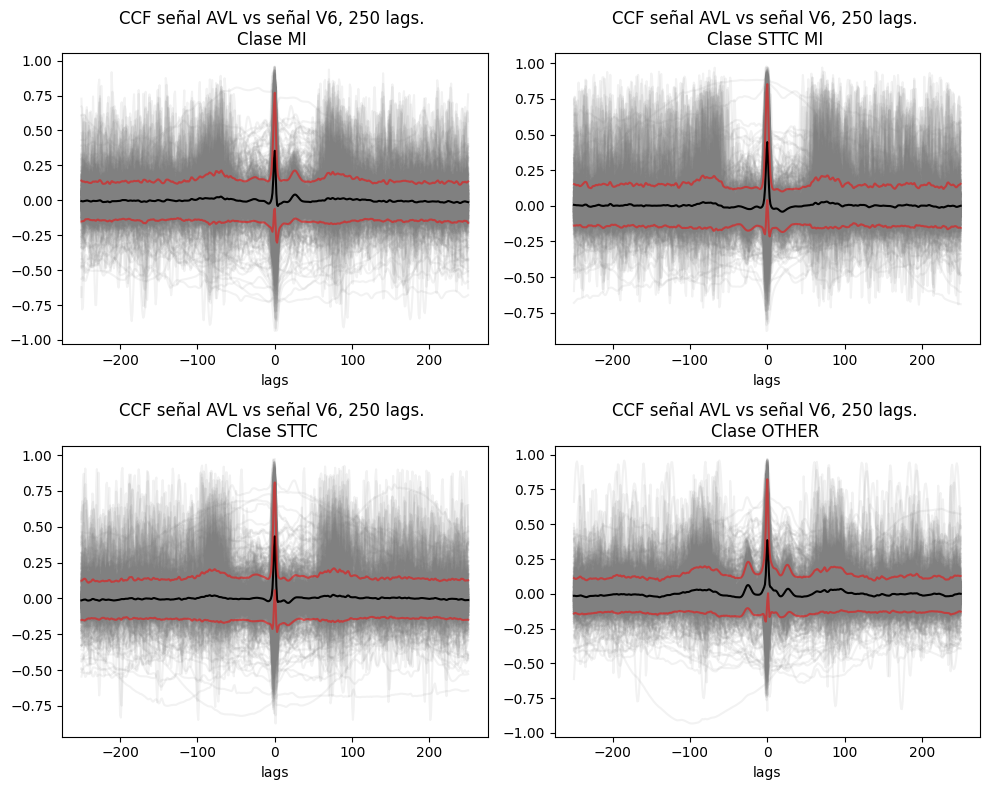

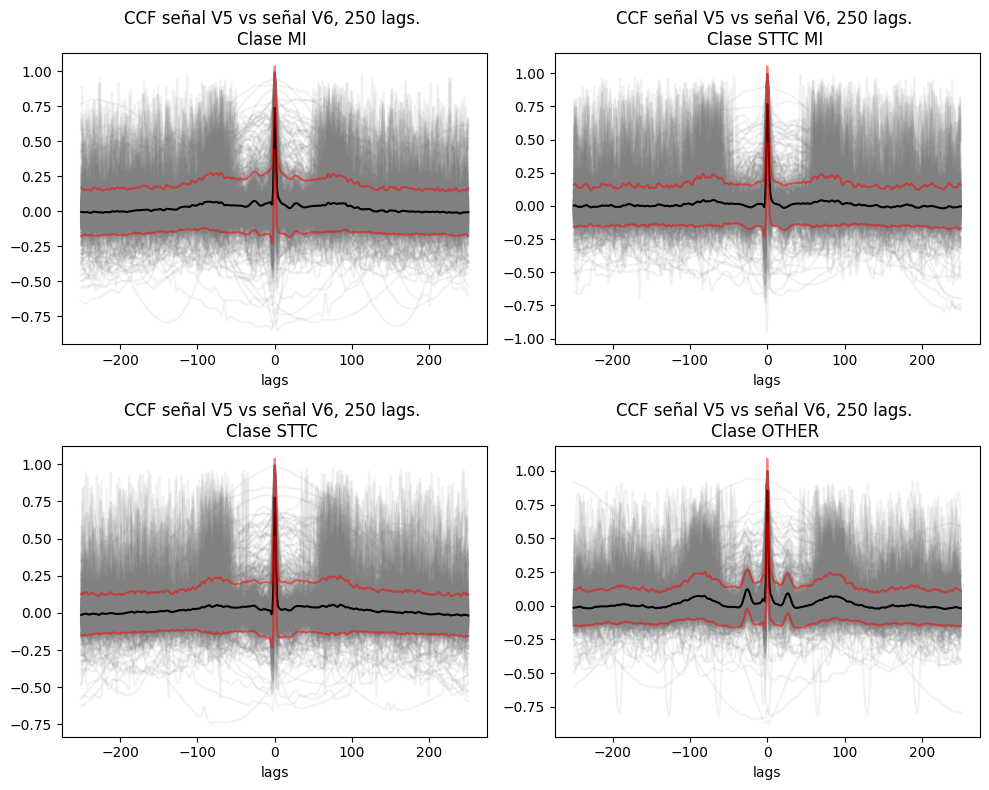

In [21]:
plot_ccf_faces_stats(df_mi_ccf,
                        df_sttc_mi_ccf,
                        df_sttc_ccf,
                        df_other_ccf,
                   lateral_combinaciones,
                   status = True,
                   series = True,
                   x_lags = [],
                   con_suavizamiento = None)

#### <a id = '3d1d3'>  Análisis de cross-correlation promedio de series con intervalo de desviación estándar </a>
[índice](#0)

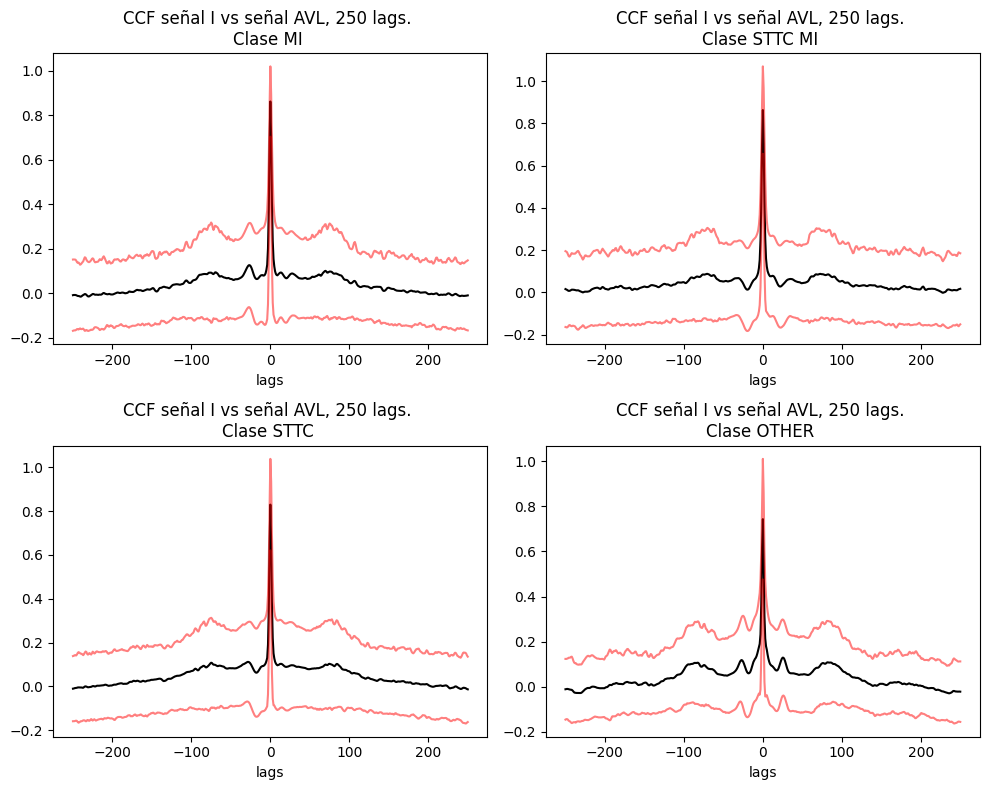

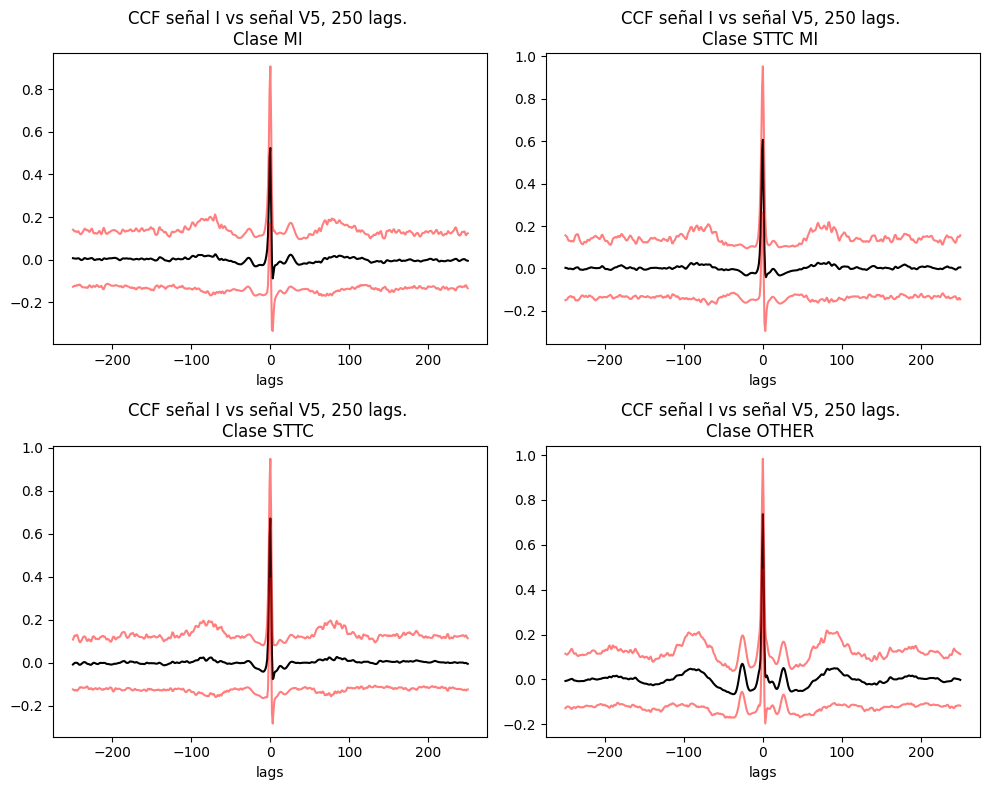

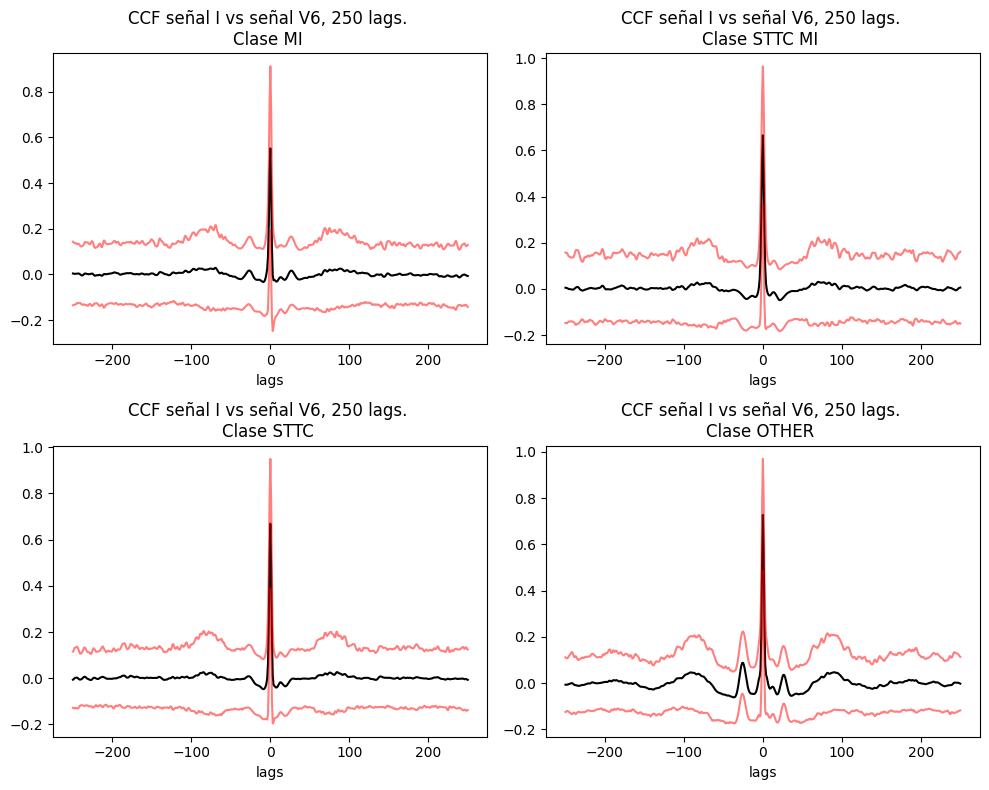

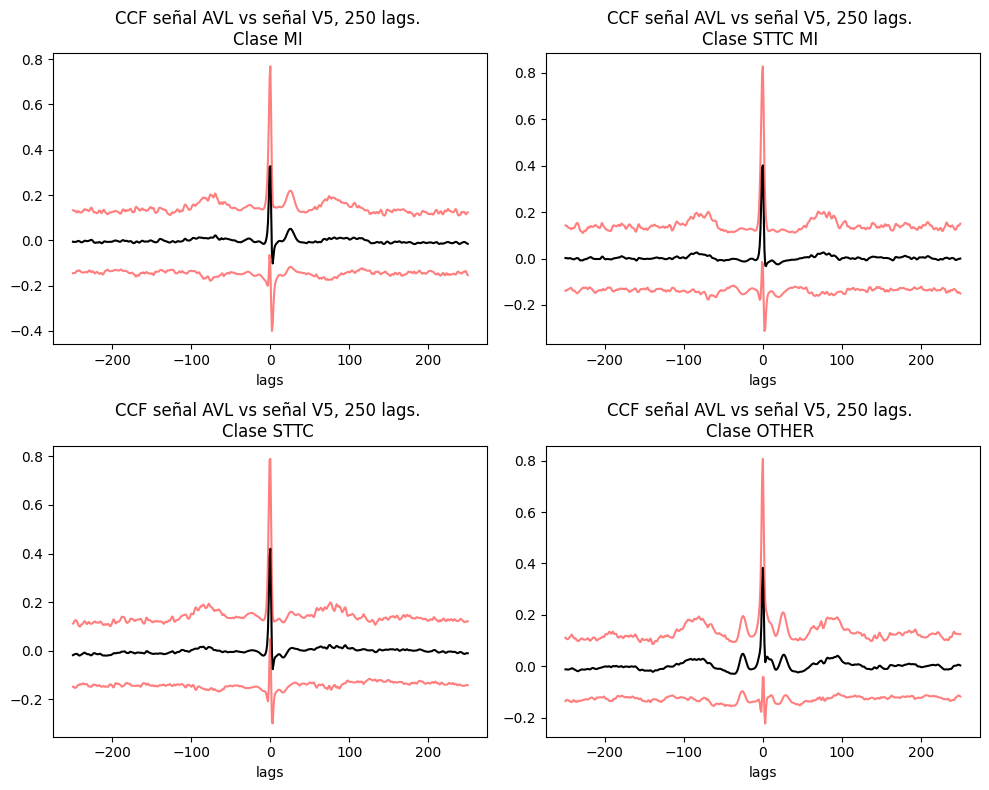

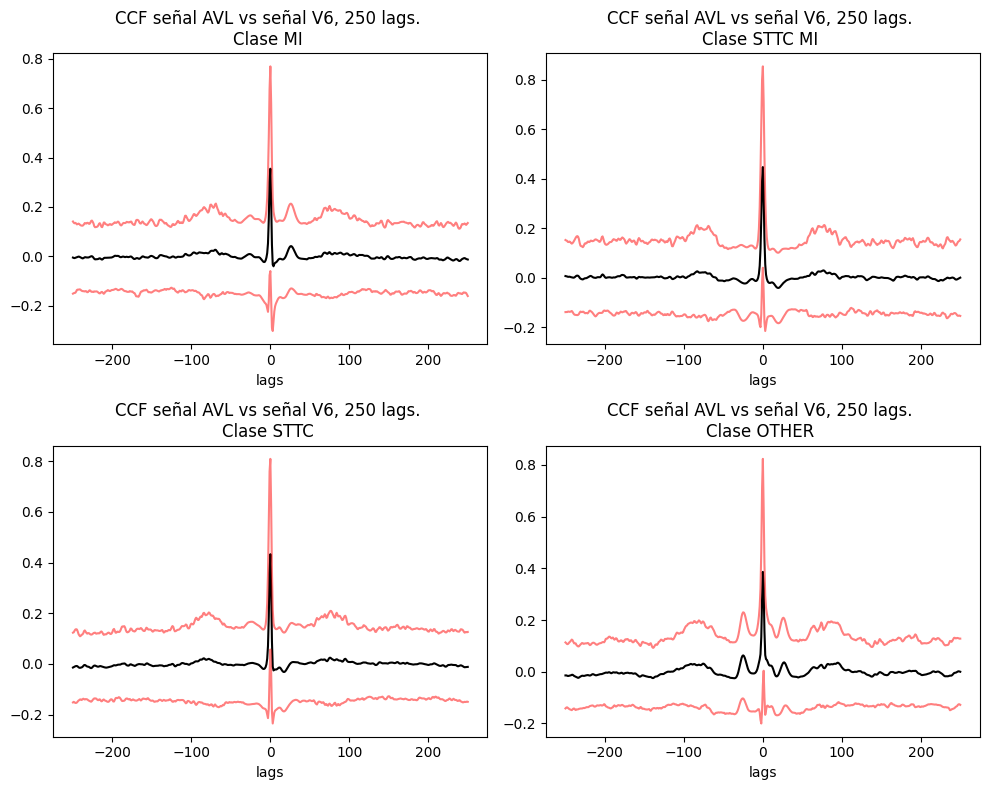

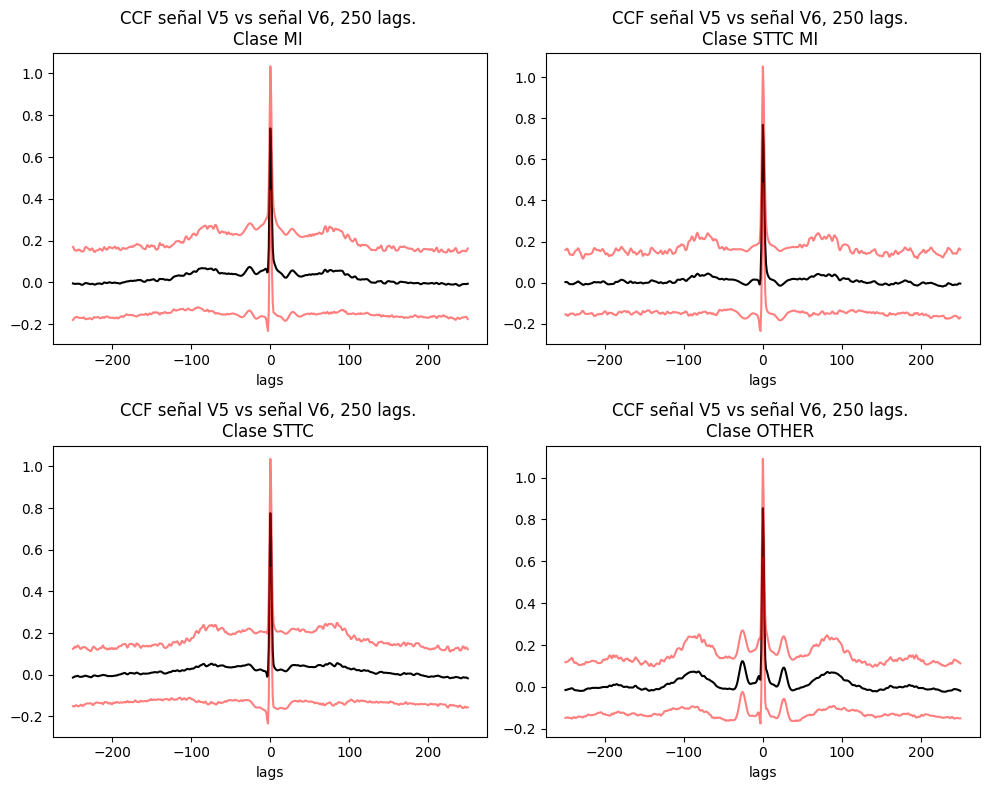

In [22]:
plot_ccf_faces_stats(df_mi_ccf,
                        df_sttc_mi_ccf,
                        df_sttc_ccf,
                        df_other_ccf,
                   lateral_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = None)

### <a id = '3d2'>  Análisis promedio de series</a>
[índice](#0)

In [18]:
df_mi_smooth_stats = get_estadistica_dict(df_mi_smooth, cara_lateral)
df_sttc_mi_smooth_stats = get_estadistica_dict(df_sttc_mi_smooth, cara_lateral)
df_sttc_smooth_stats = get_estadistica_dict(df_sttc_smooth, cara_lateral)
df_other_smooth_stats = get_estadistica_dict(df_other_smooth, cara_lateral)

#### <a id = '3d2d1'>  Promedio de series con intervalos de desviación estándar </a>
[índice](#0)

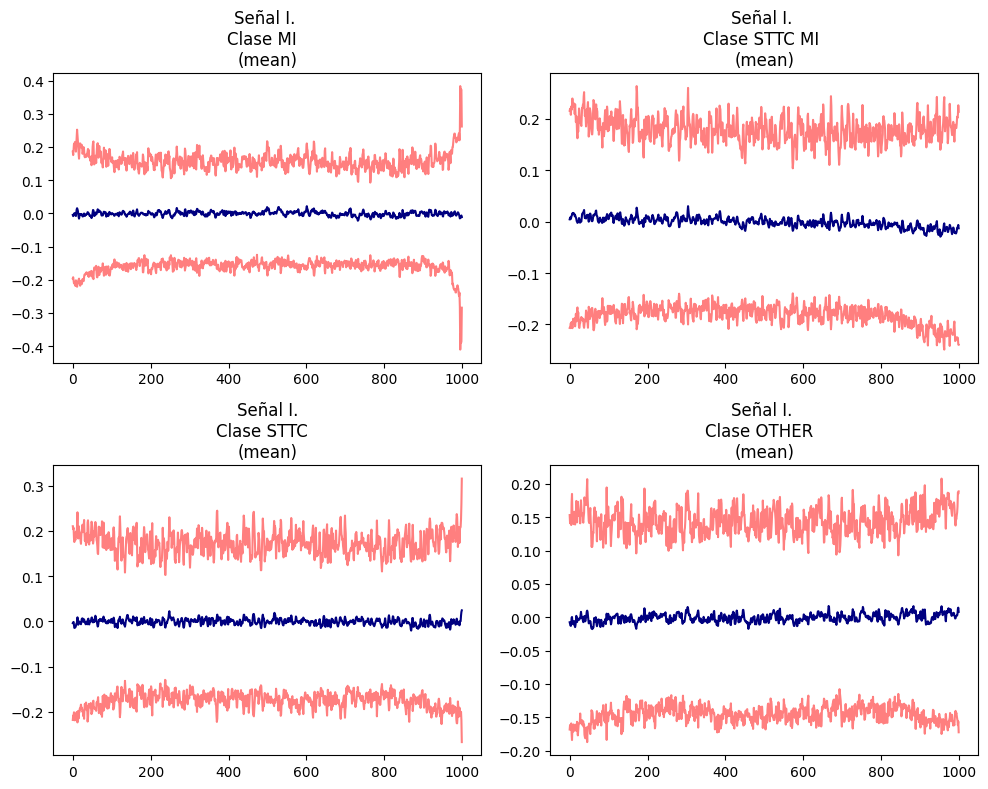

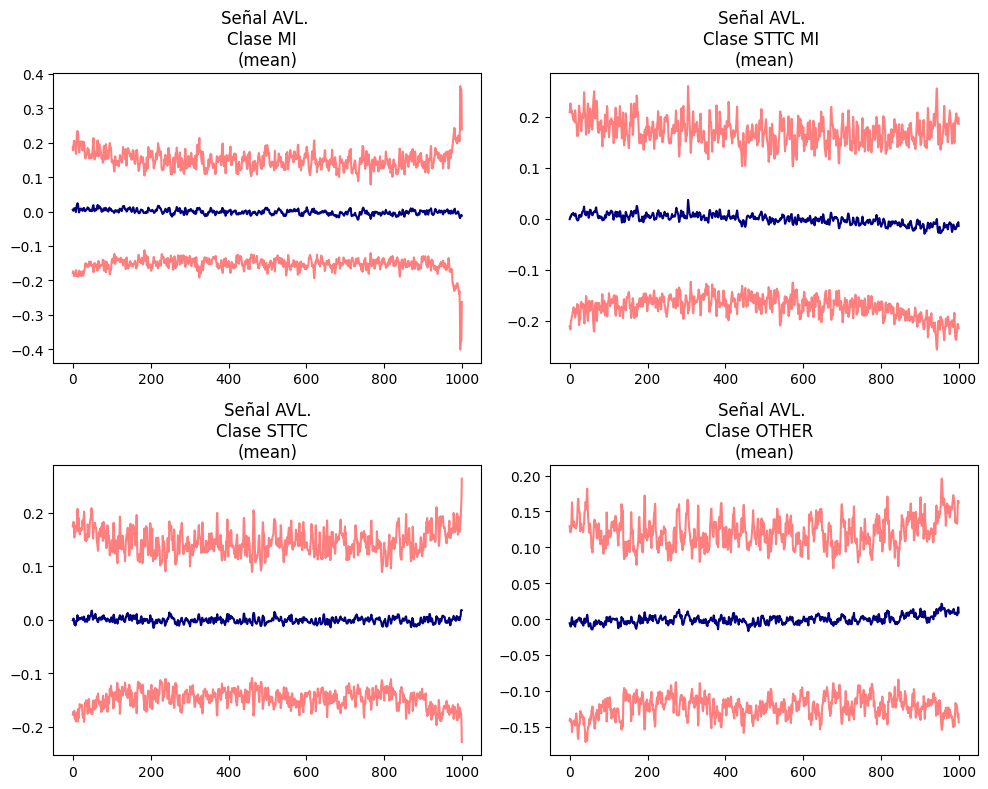

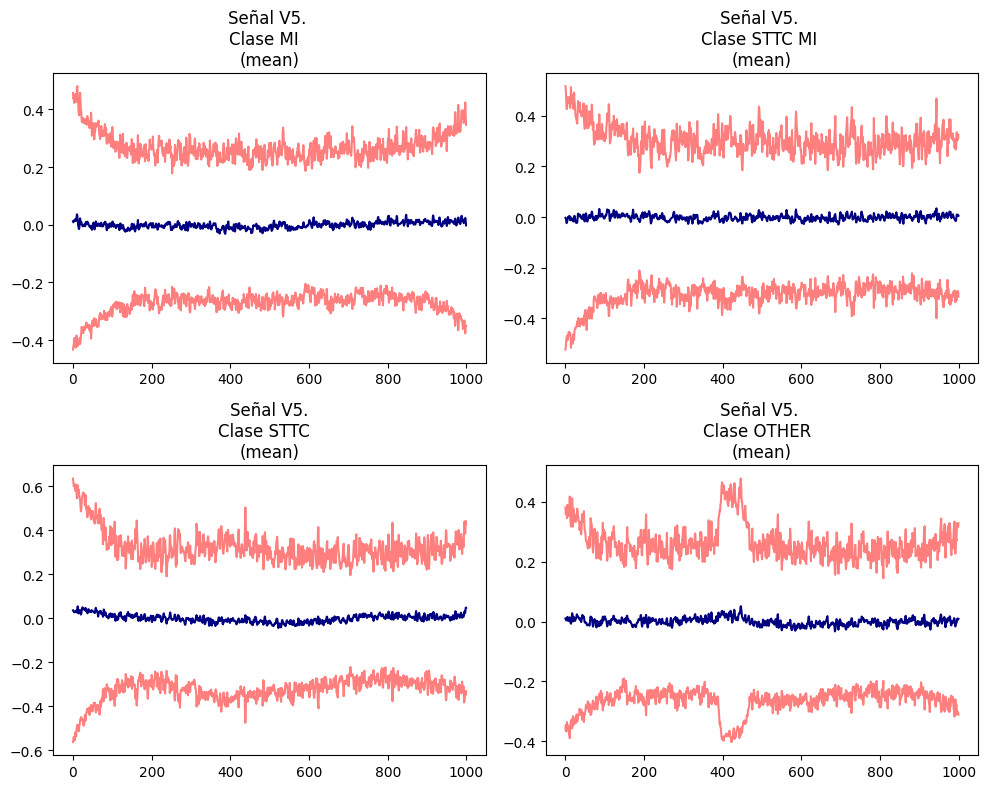

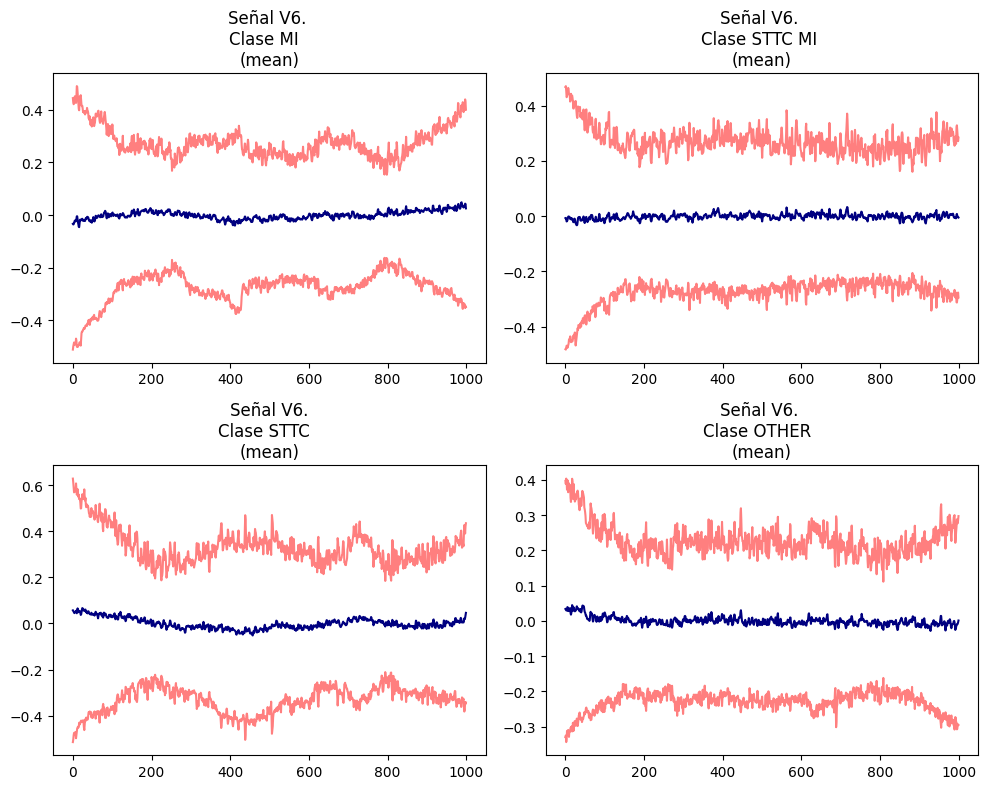

In [17]:
plot_signal_stats(df_mi_stats, df_sttc_mi_stats, df_sttc_stats, df_other_stats,
      cara_lateral, with_std=True)

#### <a id = '3d2d2'>  Promedio de series con suavizamiento (window 50) e intervalos de desviación estándar </a>
[índice](#0)

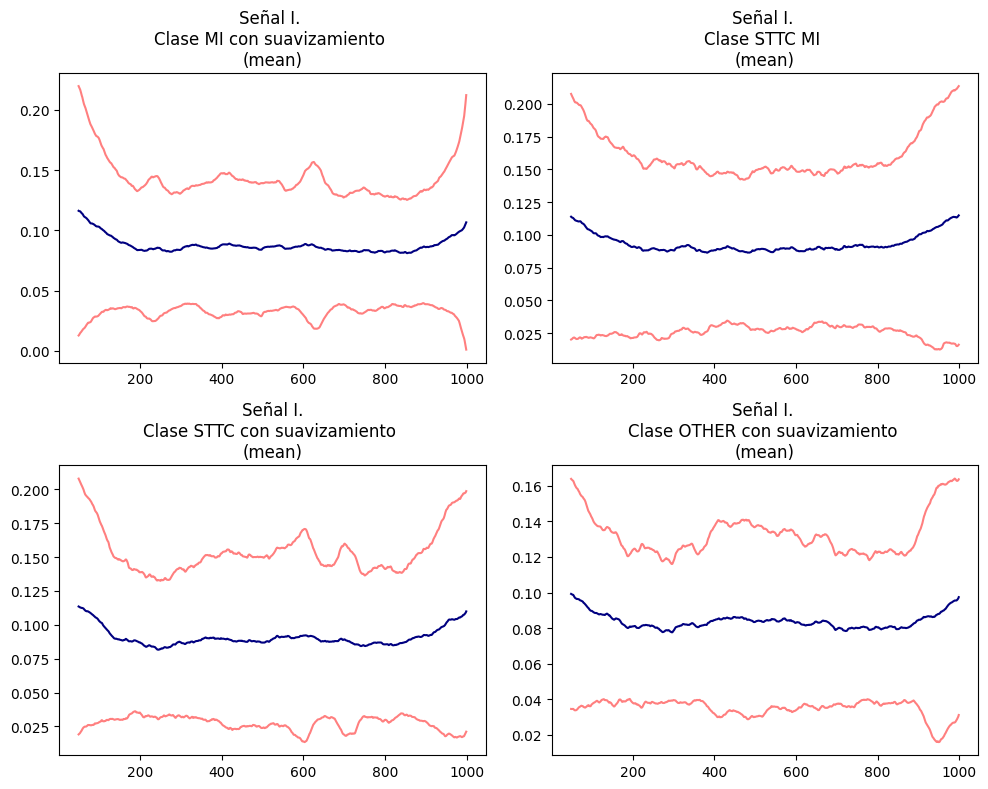

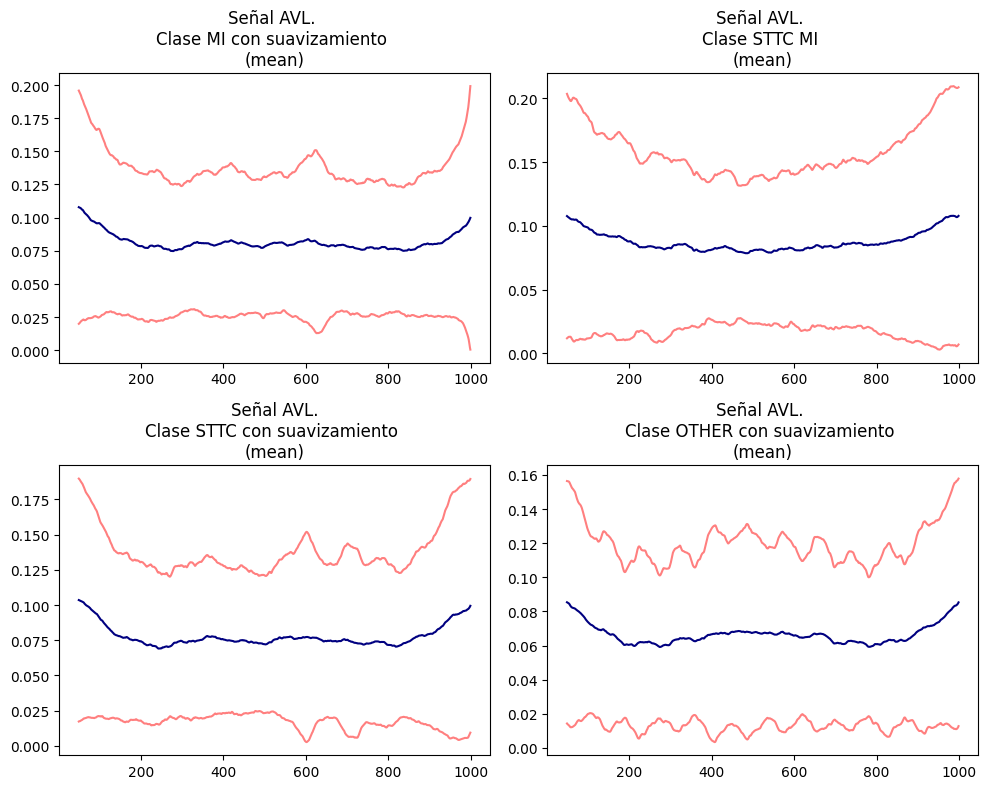

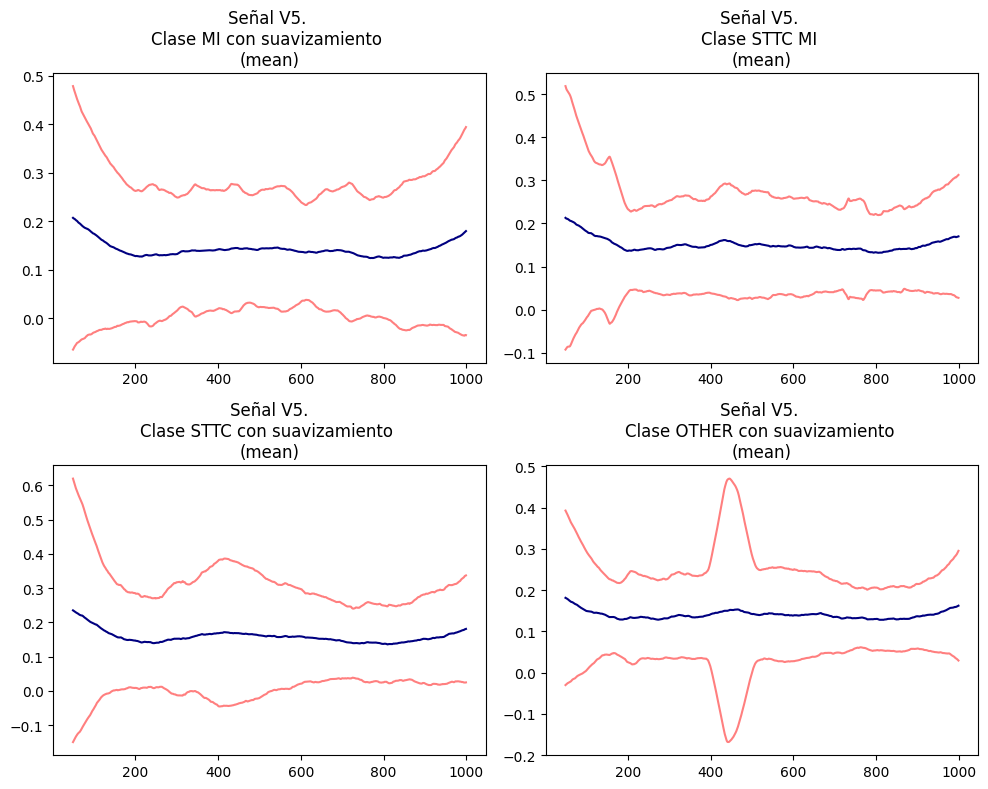

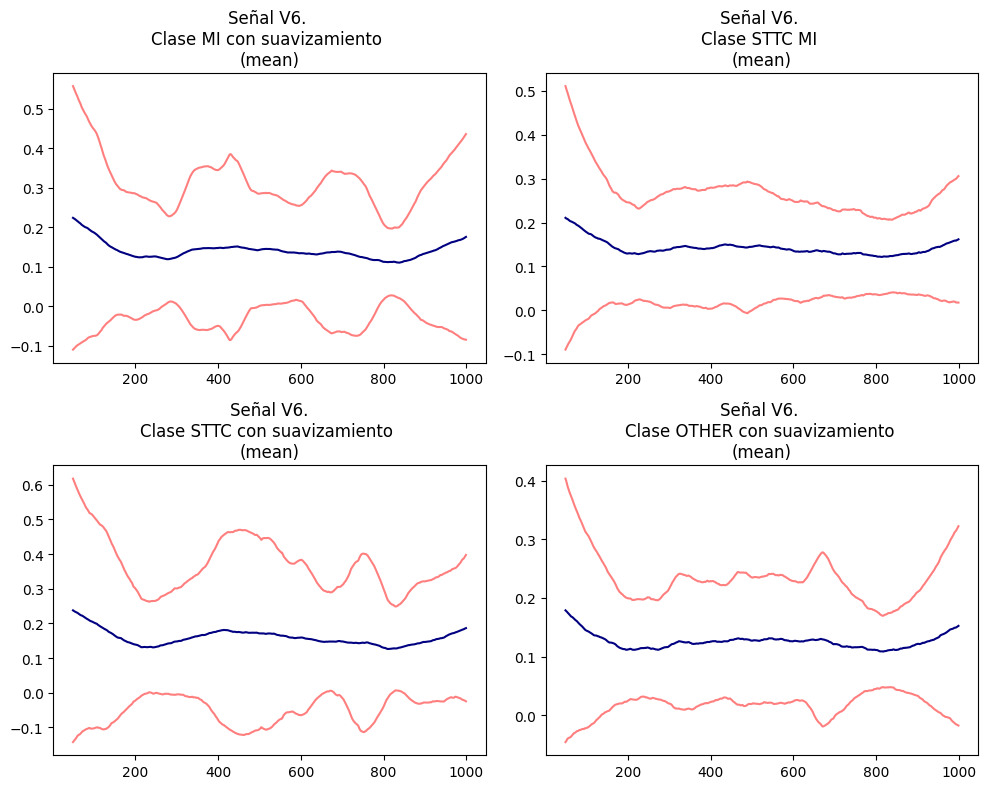

In [19]:
plot_signal_stats(df_mi_smooth_stats, df_sttc_mi_smooth_stats, df_sttc_smooth_stats, df_other_smooth_stats,
      cara_lateral, with_std=True, con_suavizamiento=True)

#### <a id = '3d2d2'>  Análisis de cross-correlation del promedio de series con suavizamiento (window 50) e intervalos de desviación estándar </a>
[índice](#0)

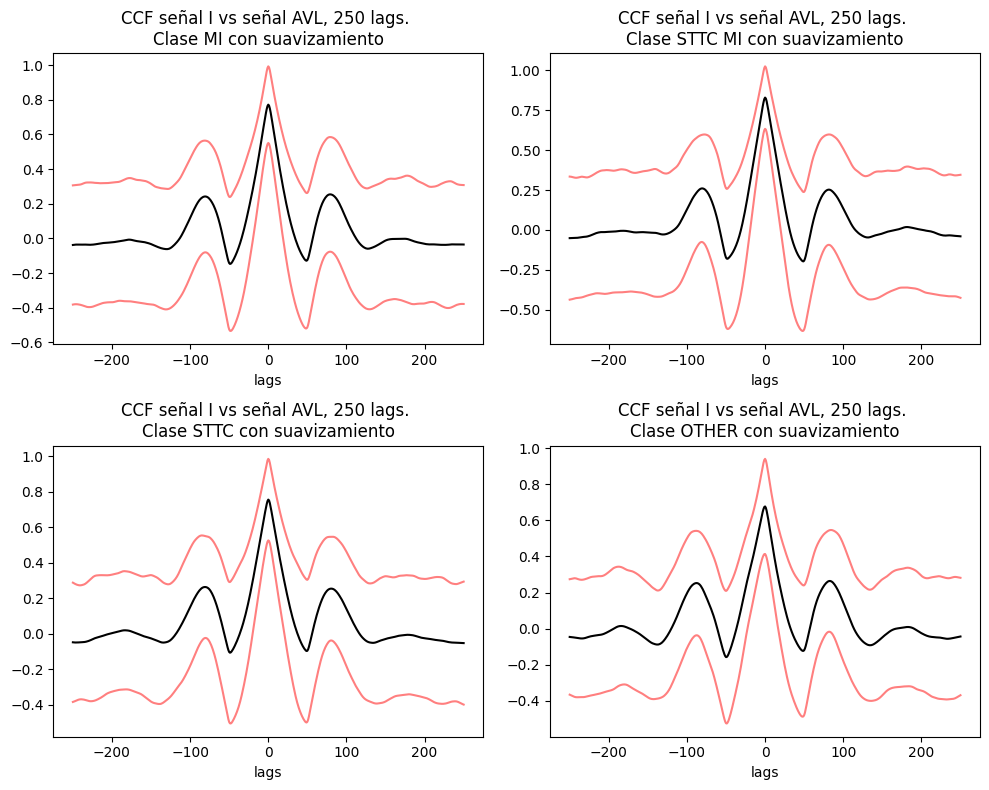

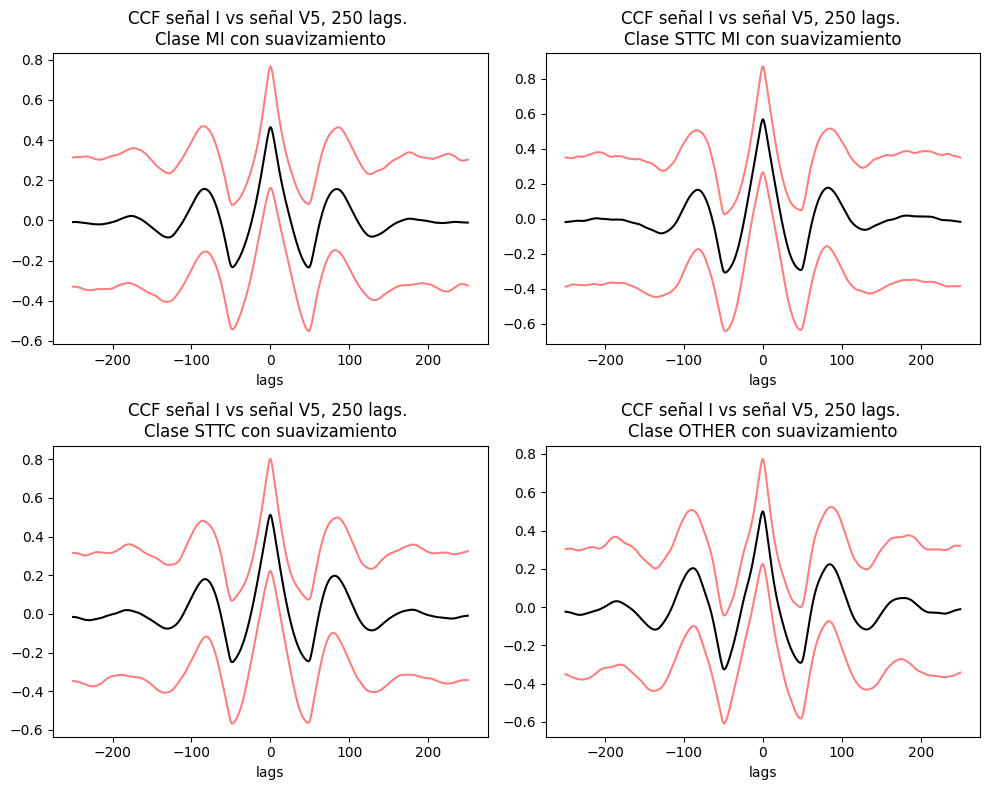

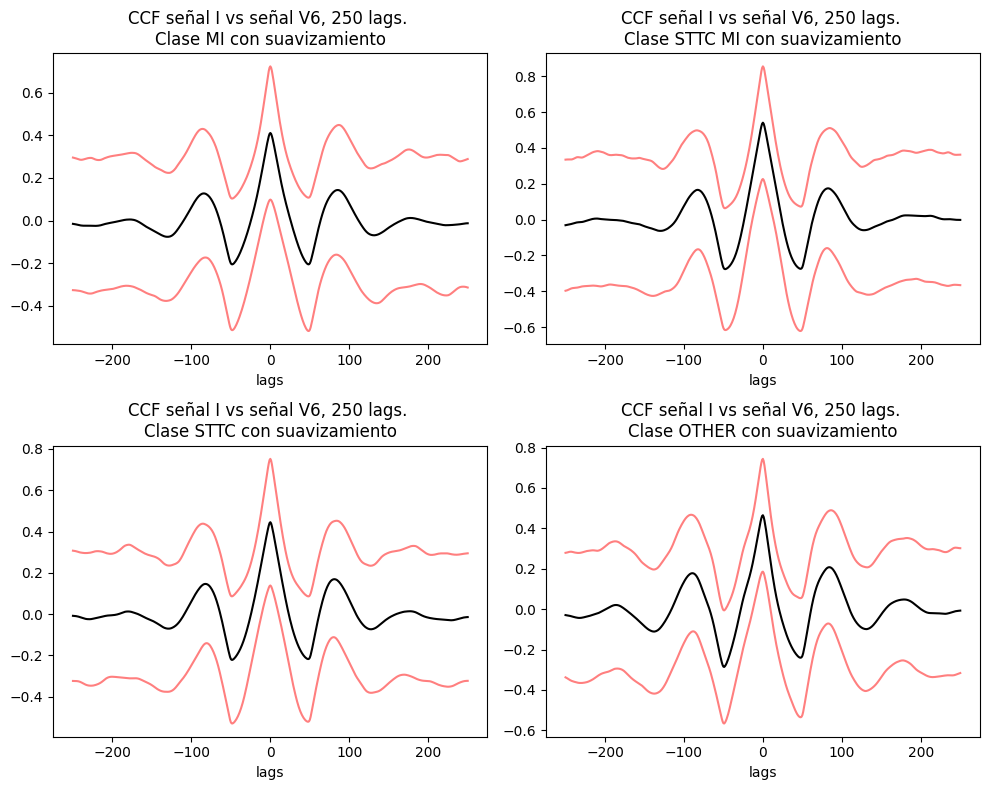

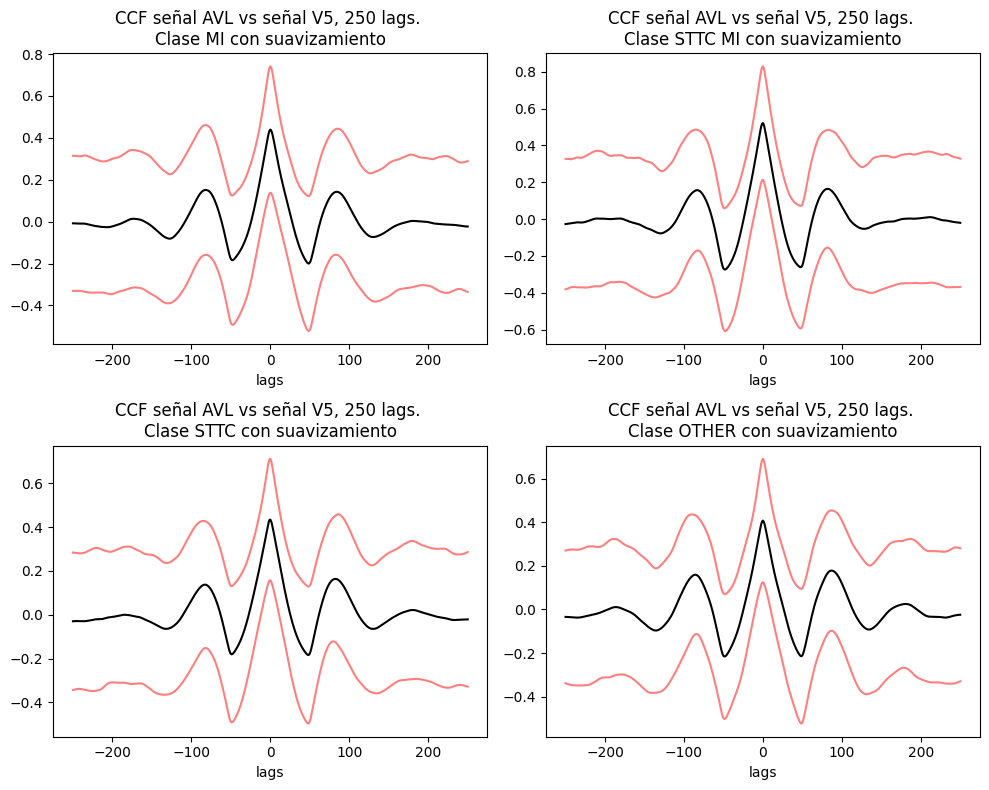

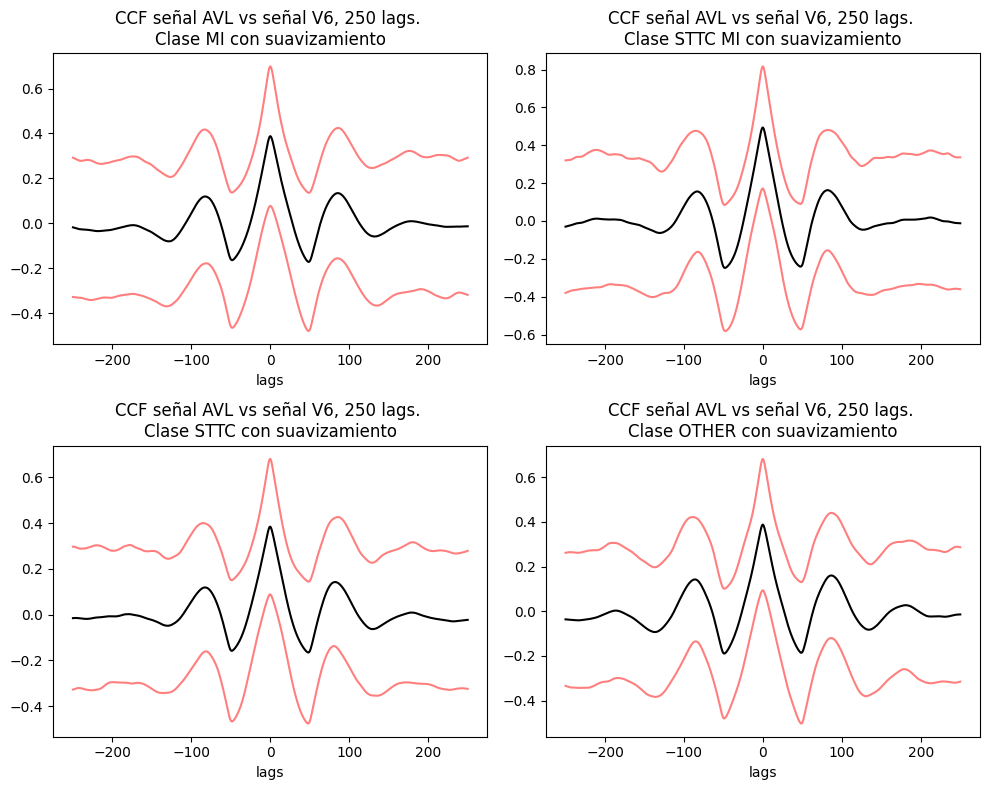

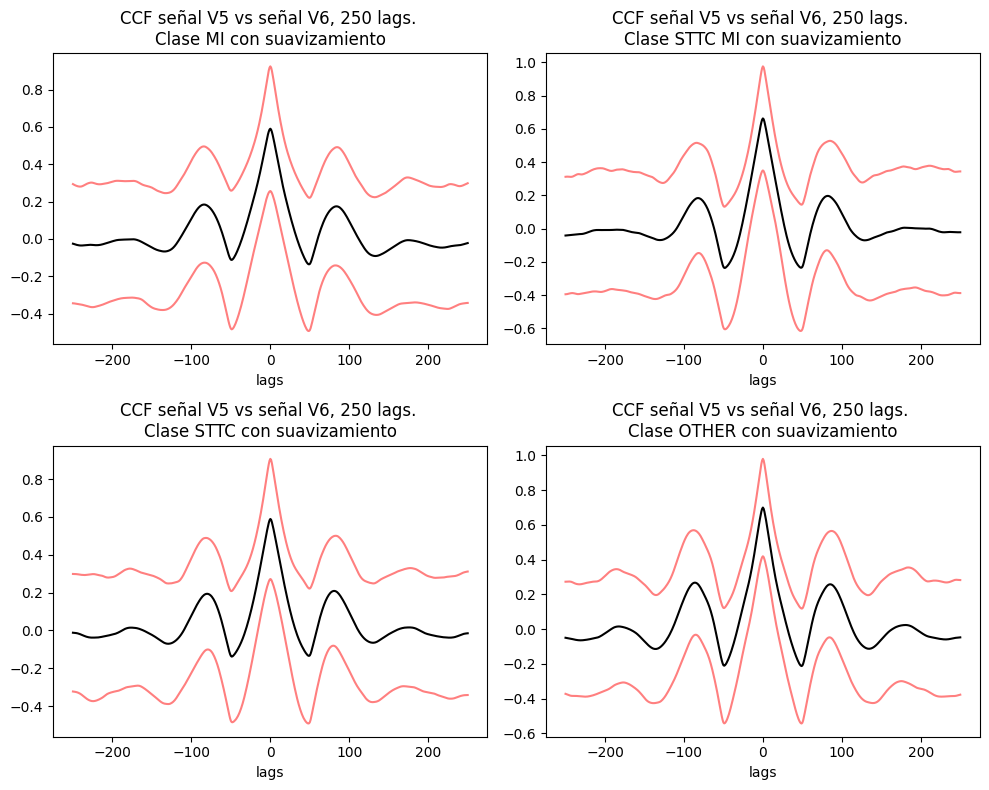

In [23]:
plot_ccf_faces_stats(df_mi_smooth_ccf,
                        df_sttc_mi_smooth_ccf,
                        df_sttc_smooth_ccf,
                        df_other_smooth_ccf,
                   lateral_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = True)

### <a id = '3d3'>  Análisis de cross-correlation con ventana (window) particular </a>
[índice](#0)

#### <a id = '3d3d1'> Análisis de series de Cara Lateral con ventana (window) particular </a>
[índice](#0)

In [24]:
df_mi_smooth_part = dict_apply_smooth(df_mi, list_signals, dict_window = dict_data_jump["MI"])
df_sttc_mi_smooth_part = dict_apply_smooth(df_sttc_mi, list_signals, dict_window = dict_data_jump['STTC MI'])
df_sttc_smooth_part = dict_apply_smooth(df_sttc, list_signals, dict_window = dict_data_jump['STTC'])
df_other_smooth_part = dict_apply_smooth(df_other, list_signals, dict_window = dict_data_jump['OTHER'])

df_mi_smooth_ccf_part_cl = genera_dict_comb_ccf(df_mi_smooth_part, lateral_combinaciones)
df_sttc_mi_smooth_ccf_part_cl = genera_dict_comb_ccf(df_sttc_mi_smooth_part, lateral_combinaciones)
df_sttc_smooth_ccf_part_cl = genera_dict_comb_ccf(df_sttc_smooth_part, lateral_combinaciones)
df_other_smooth_ccf_part_cl = genera_dict_comb_ccf(df_other_smooth_part, lateral_combinaciones)

df_mi_smooth_stats_part_cl = get_estadistica_dict(df_mi_smooth_part, cara_lateral)
df_sttc_mi_smooth_stats_part_cl = get_estadistica_dict(df_sttc_mi_smooth_part, cara_lateral)
df_sttc_smooth_stats_part_cl = get_estadistica_dict(df_sttc_smooth_part, cara_lateral)
df_other_smooth_stats_part_cl = get_estadistica_dict(df_other_smooth_part, cara_lateral)


##### <a id = '3d3d1d1'>  Análisis de series con ventana (window) particular Cara Lateral </a>
[índice](#0)

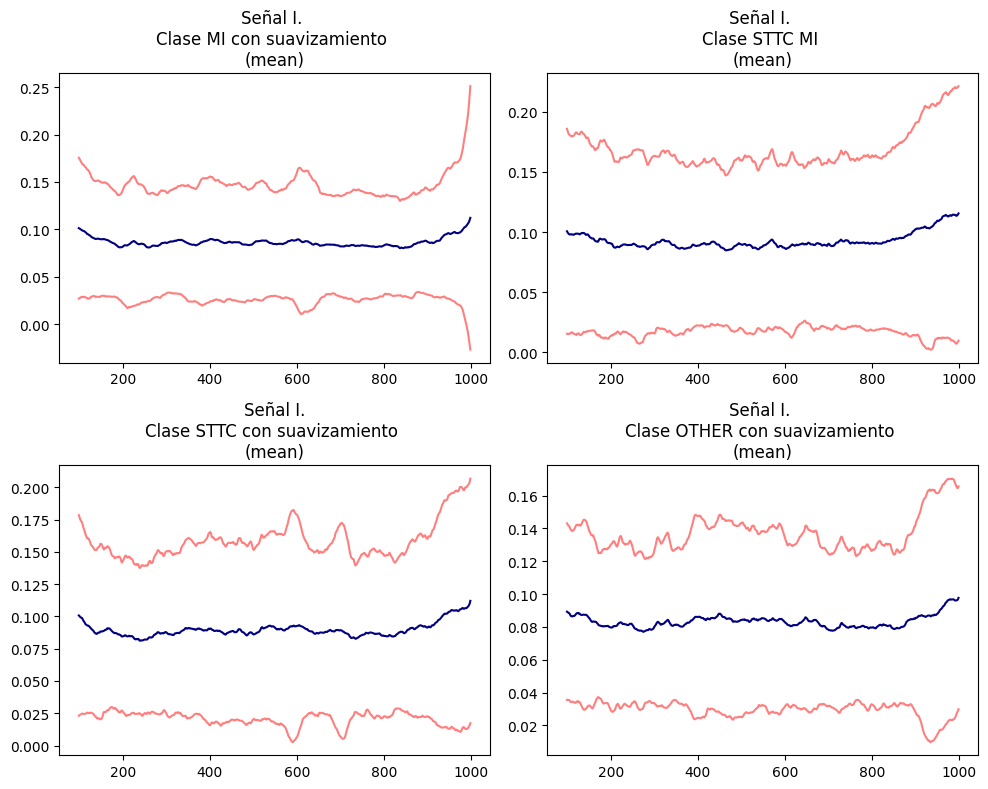

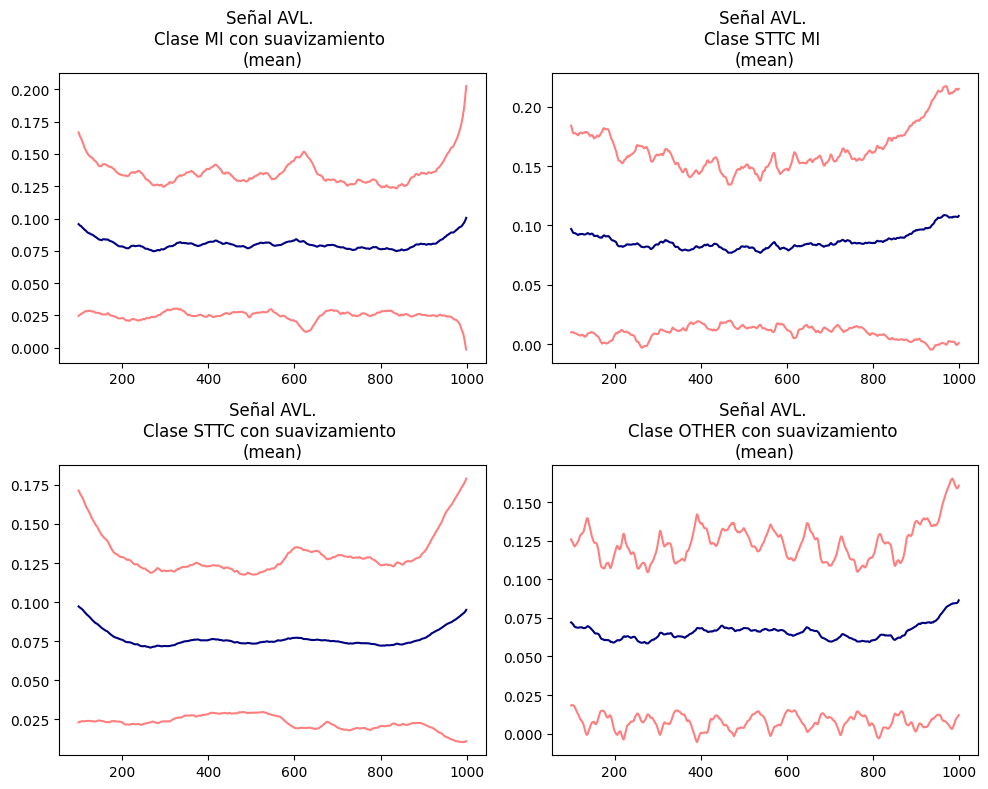

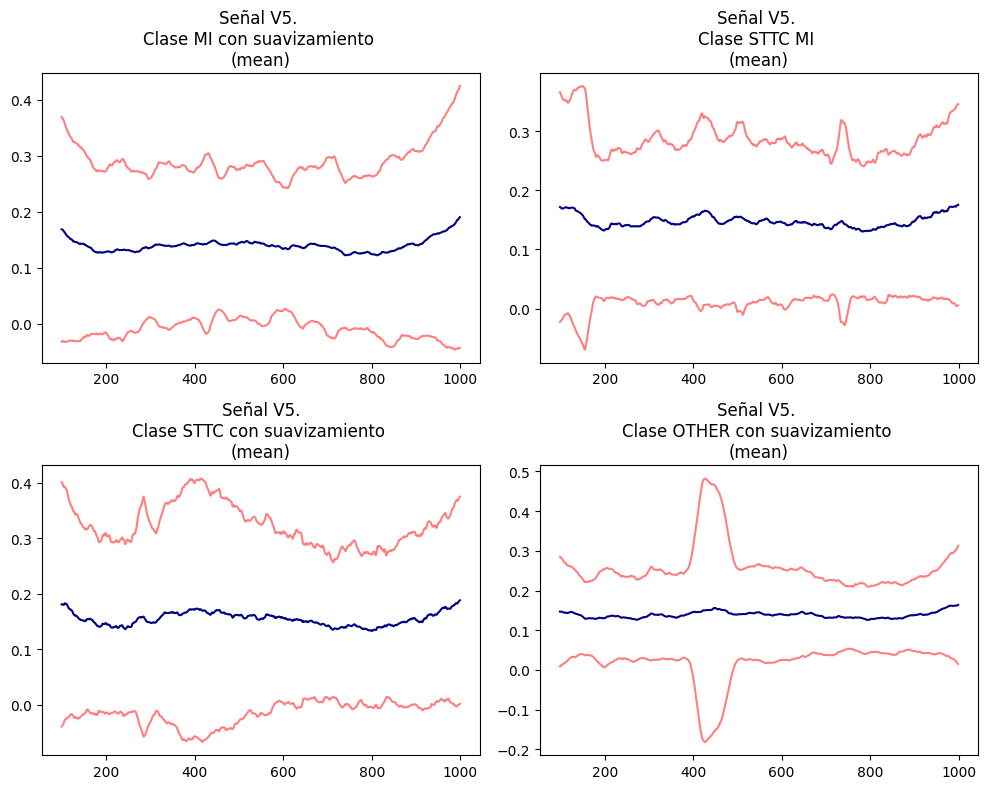

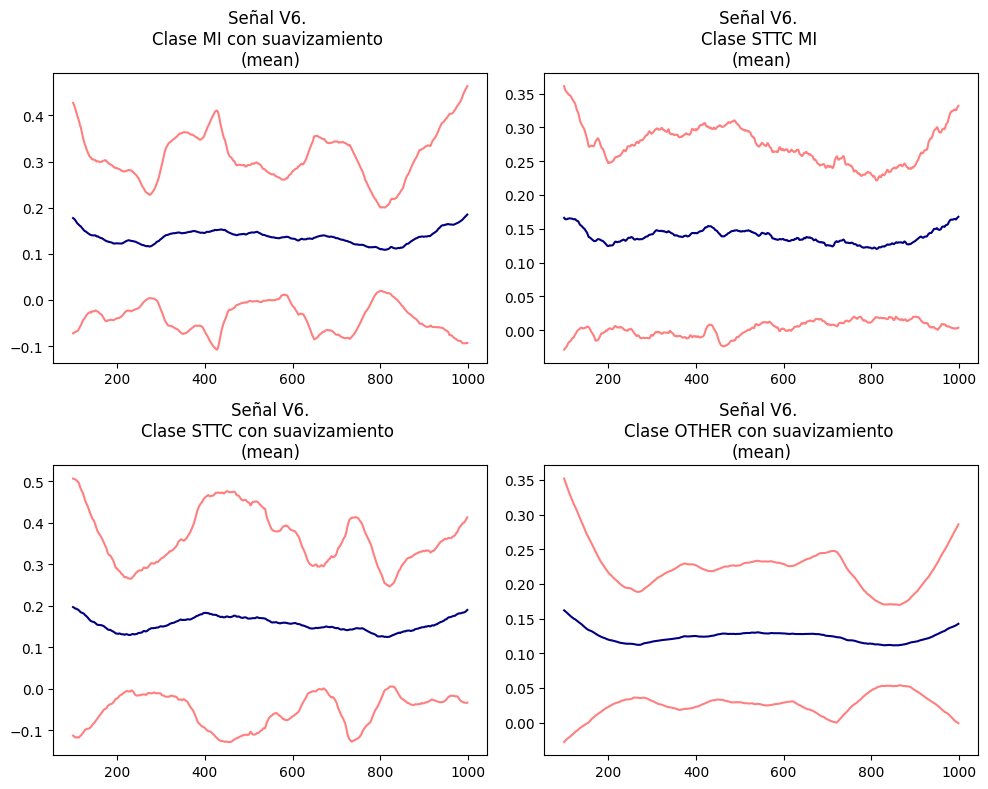

In [25]:
plot_signal_stats(df_mi_smooth_stats_part_cl, df_sttc_mi_smooth_stats_part_cl, df_sttc_smooth_stats_part_cl, df_other_smooth_stats_part_cl,
      cara_lateral, with_std=True, con_suavizamiento=True)

##### <a id = '3d3d1d2'>  Análisis de cross-correlation con ventana (window) particular Cara Lateral </a>
[índice](#0)

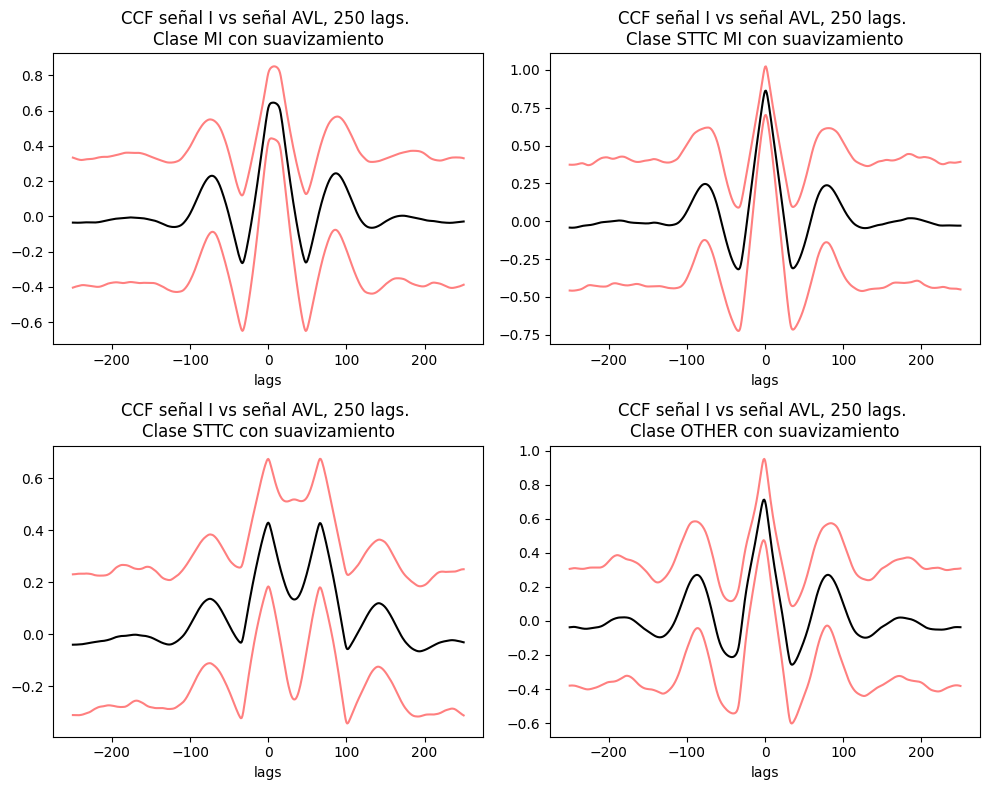

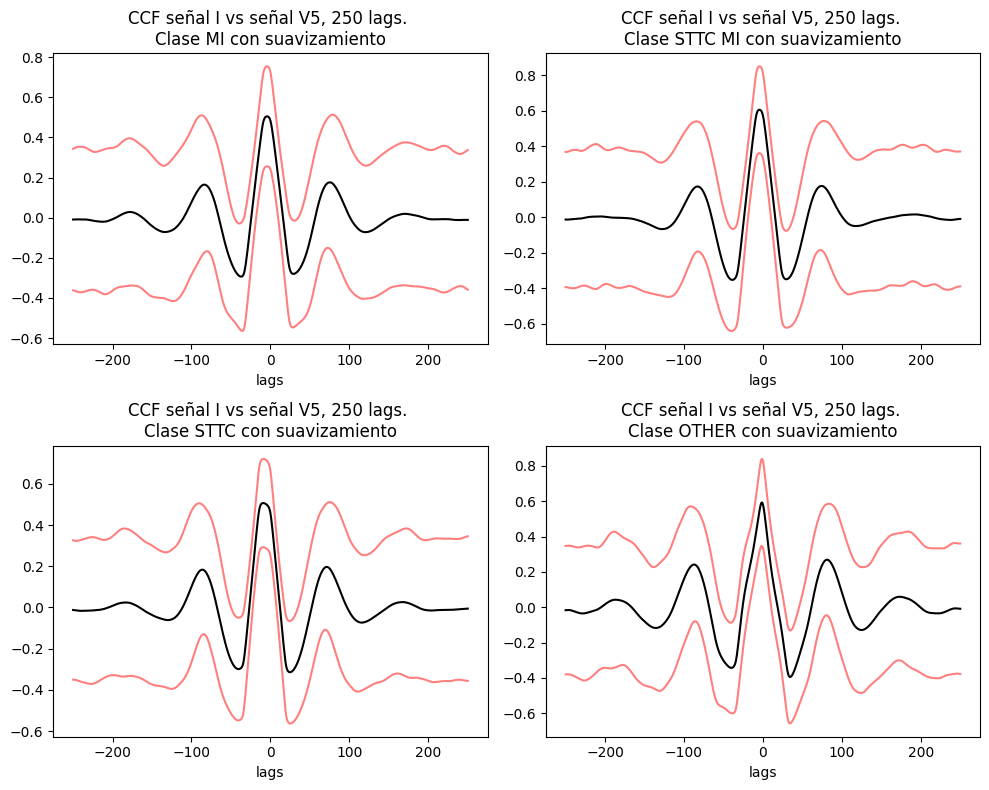

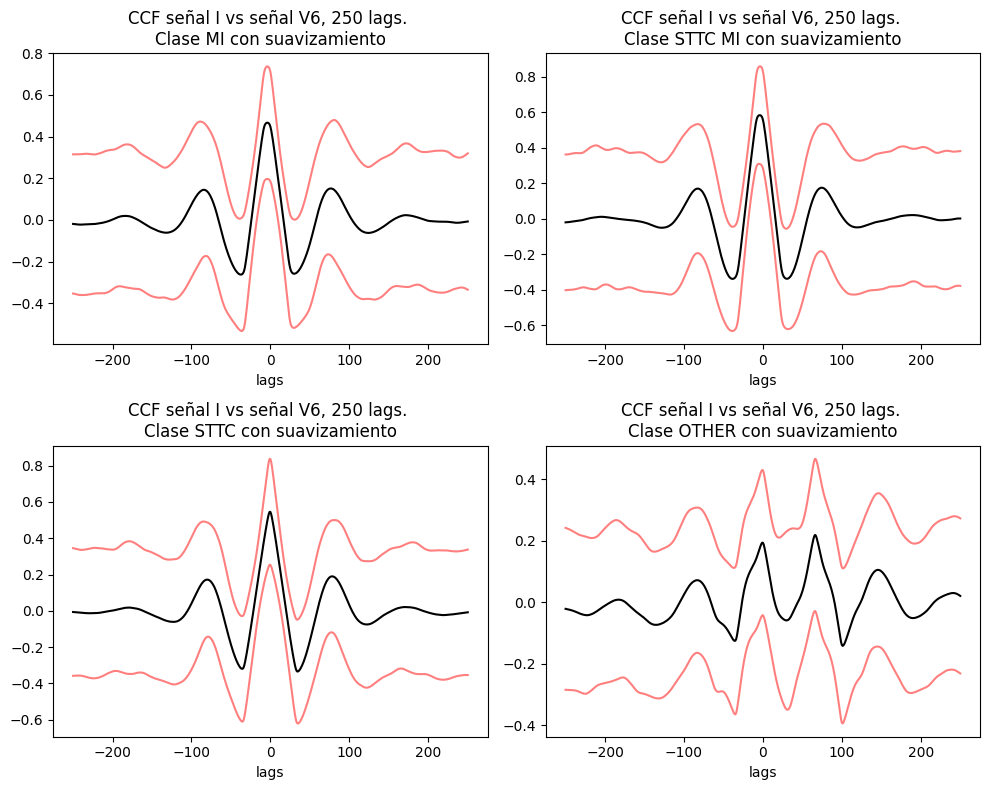

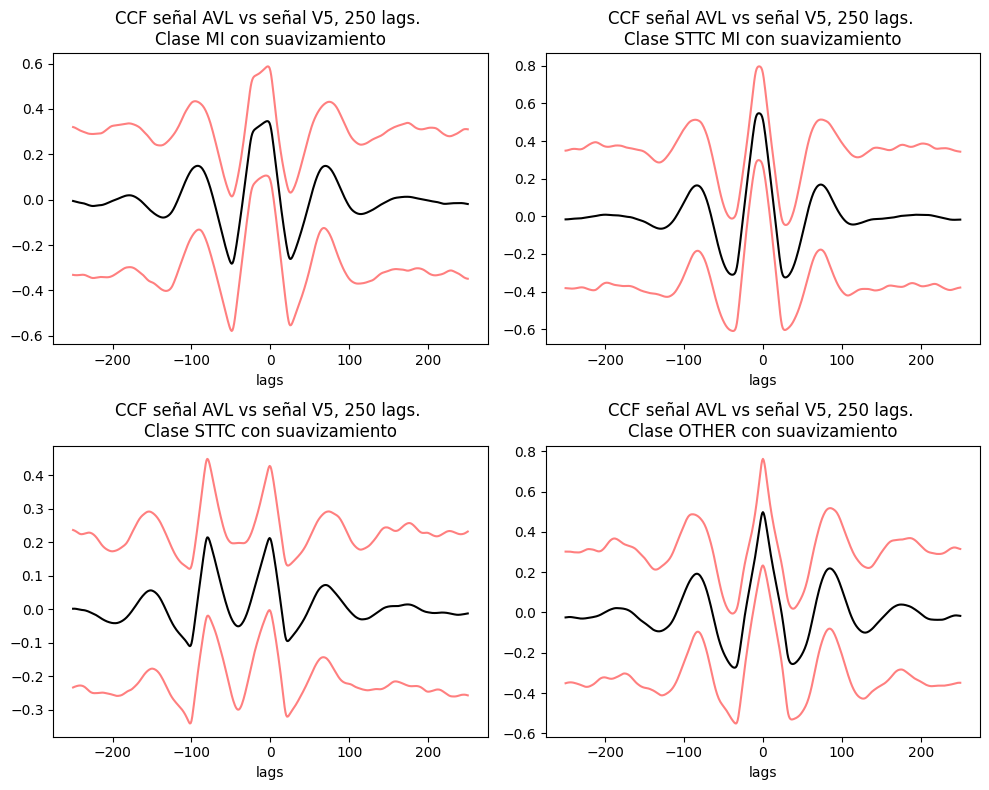

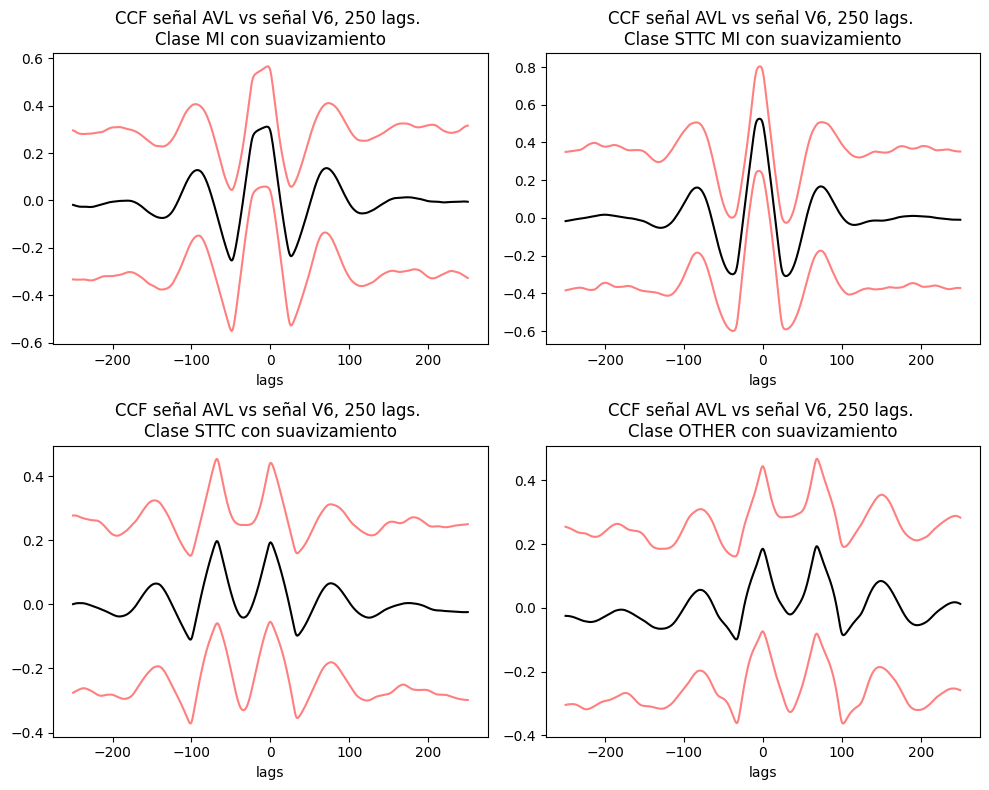

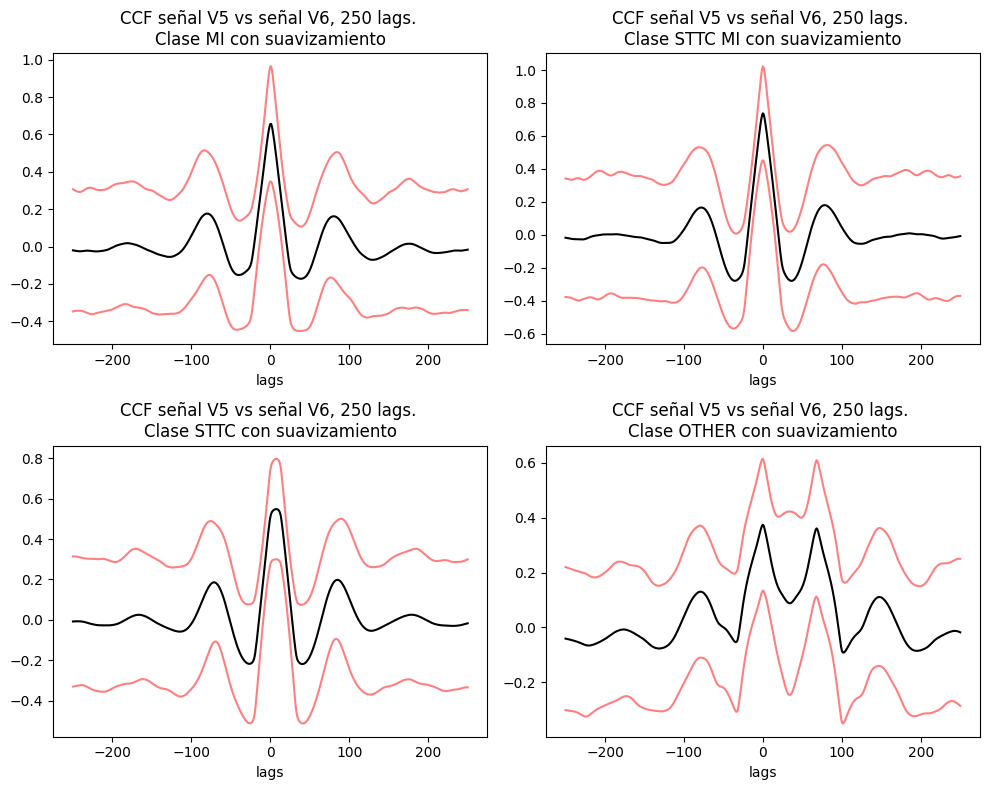

In [26]:
plot_ccf_faces_stats(df_mi_smooth_ccf_part_cl,
                        df_sttc_mi_smooth_ccf_part_cl,
                        df_sttc_smooth_ccf_part_cl,
                        df_other_smooth_ccf_part_cl,
                   lateral_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = True)

#### <a id = '3d3d2'> Análisis de series de Cara Anterior con ventana (window) particular </a>
[índice](#0)

In [27]:
df_mi_smooth_part = dict_apply_smooth(df_mi, list_signals, dict_window = dict_data_jump["MI"])
df_sttc_mi_smooth_part = dict_apply_smooth(df_sttc_mi, list_signals, dict_window = dict_data_jump['STTC MI'])
df_sttc_smooth_part = dict_apply_smooth(df_sttc, list_signals, dict_window = dict_data_jump['STTC'])
df_other_smooth_part = dict_apply_smooth(df_other, list_signals, dict_window = dict_data_jump['OTHER'])

df_mi_smooth_ccf_part_ca = genera_dict_comb_ccf(df_mi_smooth_part, anterior_combinaciones)
df_sttc_mi_smooth_ccf_part_ca = genera_dict_comb_ccf(df_sttc_mi_smooth_part, anterior_combinaciones)
df_sttc_smooth_ccf_part_ca = genera_dict_comb_ccf(df_sttc_smooth_part, anterior_combinaciones)
df_other_smooth_ccf_part_ca = genera_dict_comb_ccf(df_other_smooth_part, anterior_combinaciones)

df_mi_smooth_stats_part_ca = get_estadistica_dict(df_mi_smooth_part, cara_anterior)
df_sttc_mi_smooth_stats_part_ca = get_estadistica_dict(df_sttc_mi_smooth_part, cara_anterior)
df_sttc_smooth_stats_part_ca = get_estadistica_dict(df_sttc_smooth_part, cara_anterior)
df_other_smooth_stats_part_ca = get_estadistica_dict(df_other_smooth_part, cara_anterior)

##### <a id = '3d3d2d1'>  Análisis de series con ventana (window) particular Cara Anterior </a>
[índice](#0)

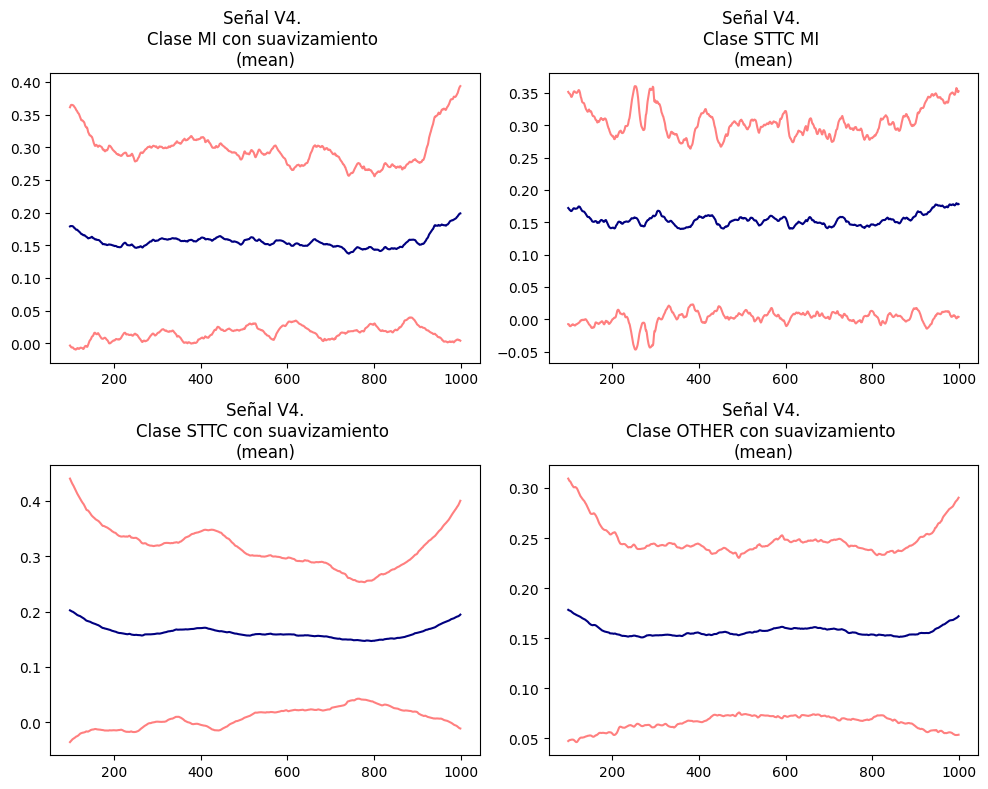

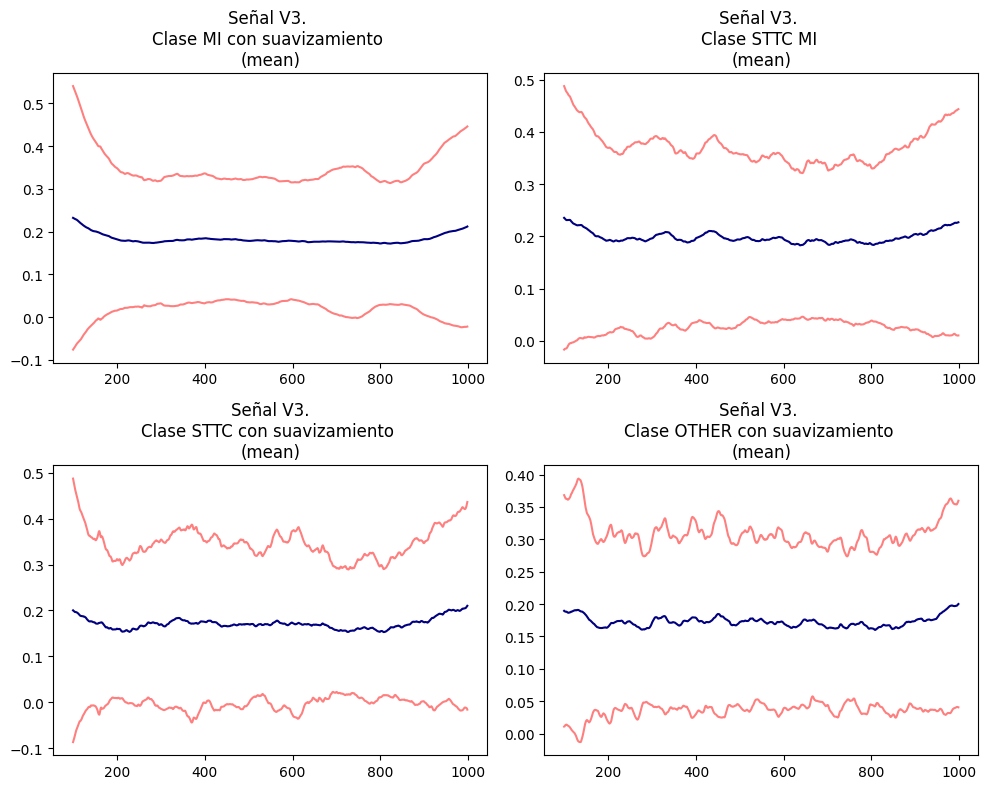

In [28]:
plot_signal_stats(df_mi_smooth_stats_part_ca, df_sttc_mi_smooth_stats_part_ca, df_sttc_smooth_stats_part_ca, df_other_smooth_stats_part_ca,
      cara_anterior, with_std=True, con_suavizamiento=True)

##### <a id = '3d3d2d2'>  Análisis de cross-correlation con ventana (window) particular Cara Anterior </a>
[índice](#0)

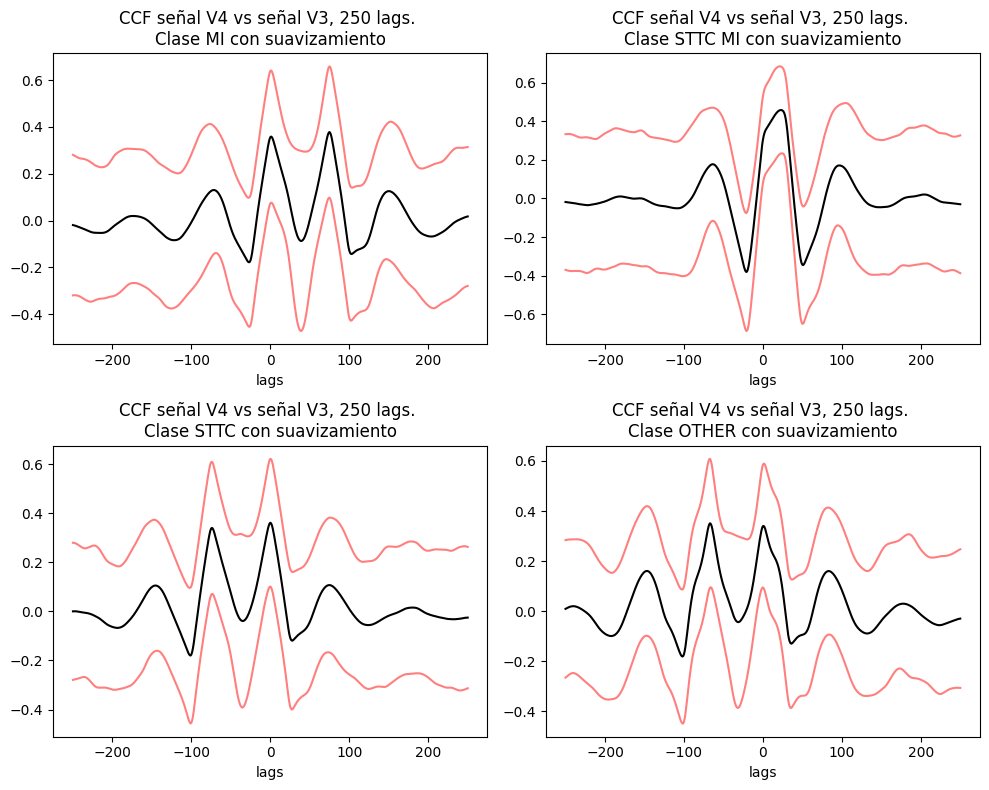

In [29]:
plot_ccf_faces_stats(df_mi_smooth_ccf_part_ca,
                        df_sttc_mi_smooth_ccf_part_ca,
                        df_sttc_smooth_ccf_part_ca,
                        df_other_smooth_ccf_part_ca,
                   anterior_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = True)

#### <a id = '3d3d3'> Análisis de series de Cara Interior con ventana (window) particular </a>
[índice](#0)

In [30]:
df_mi_smooth_part = dict_apply_smooth(df_mi, list_signals, dict_window = dict_data_jump["MI"])
df_sttc_mi_smooth_part = dict_apply_smooth(df_sttc_mi, list_signals, dict_window = dict_data_jump['STTC MI'])
df_sttc_smooth_part = dict_apply_smooth(df_sttc, list_signals, dict_window = dict_data_jump['STTC'])
df_other_smooth_part = dict_apply_smooth(df_other, list_signals, dict_window = dict_data_jump['OTHER'])

df_mi_smooth_ccf_part_ci = genera_dict_comb_ccf(df_mi_smooth_part, interior_combinaciones)
df_sttc_mi_smooth_ccf_part_ci = genera_dict_comb_ccf(df_sttc_mi_smooth_part, interior_combinaciones)
df_sttc_smooth_ccf_part_ci = genera_dict_comb_ccf(df_sttc_smooth_part, interior_combinaciones)
df_other_smooth_ccf_part_ci = genera_dict_comb_ccf(df_other_smooth_part, interior_combinaciones)

df_mi_smooth_stats_part_ci = get_estadistica_dict(df_mi_smooth_part, cara_interior)
df_sttc_mi_smooth_stats_part_ci = get_estadistica_dict(df_sttc_mi_smooth_part, cara_interior)
df_sttc_smooth_stats_part_ci = get_estadistica_dict(df_sttc_smooth_part, cara_interior)
df_other_smooth_stats_part_ci = get_estadistica_dict(df_other_smooth_part, cara_interior)

##### <a id = '3d3d3d1'>  Análisis de series con ventana (window) particular Cara Interior </a>
[índice](#0)

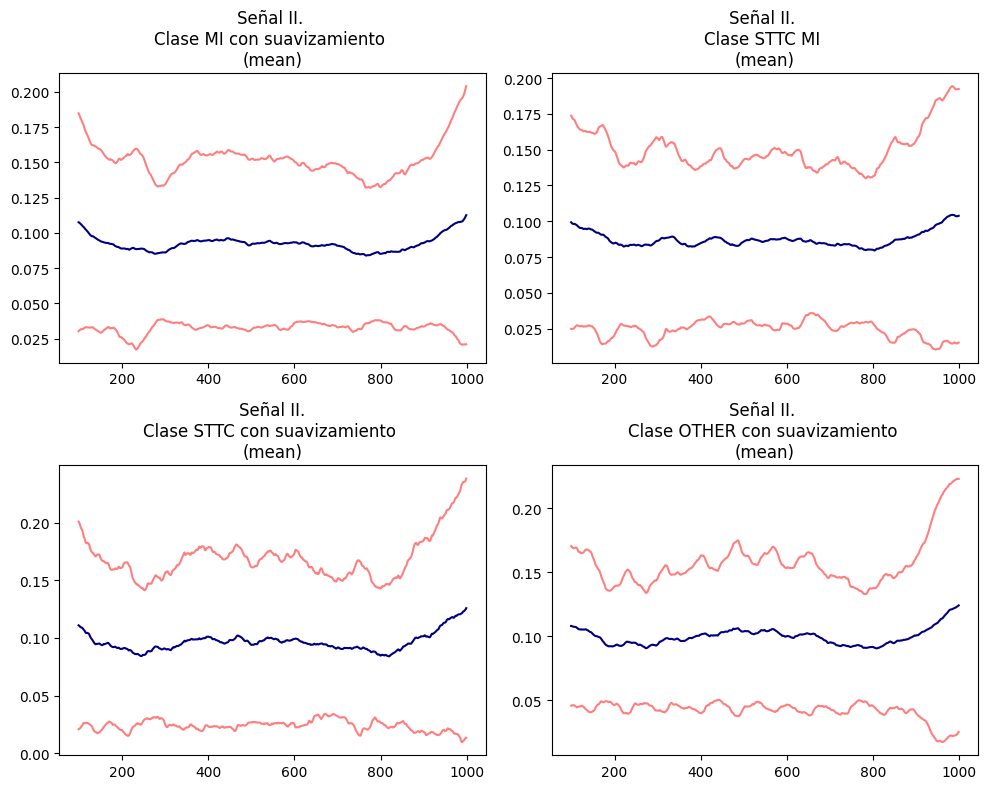

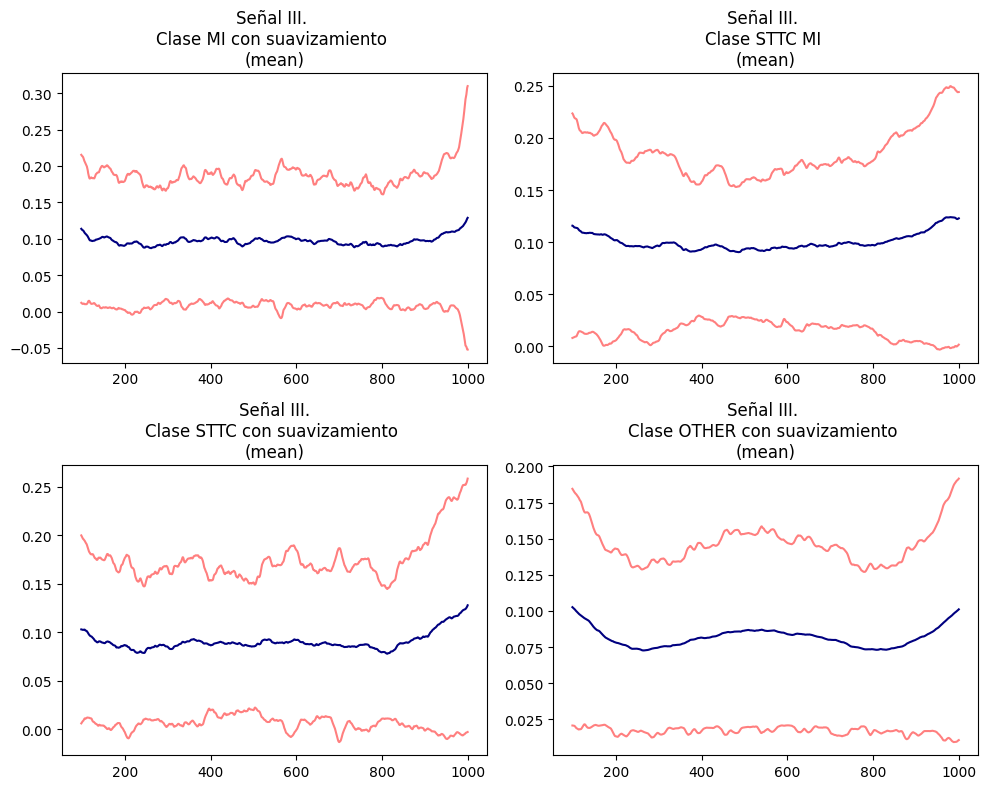

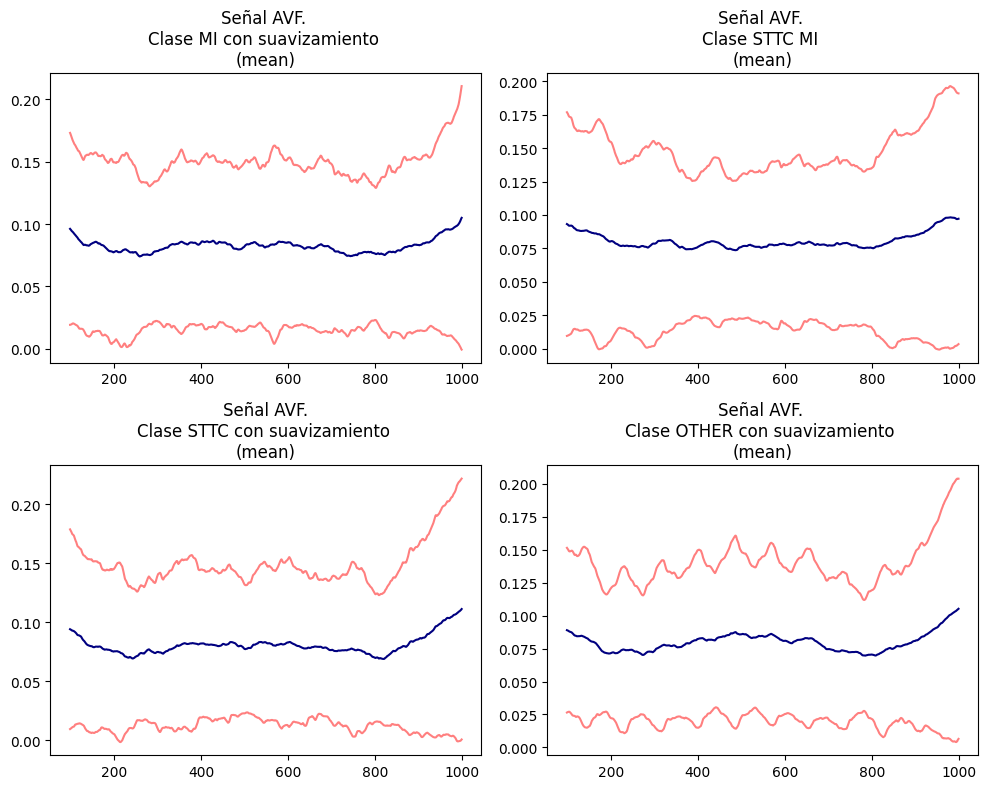

In [31]:
plot_signal_stats(df_mi_smooth_stats_part_ci, df_sttc_mi_smooth_stats_part_ci, df_sttc_smooth_stats_part_ci, df_other_smooth_stats_part_ci,
      cara_interior, with_std=True, con_suavizamiento=True)

##### <a id = '3d3d3d2'>  Análisis de cross-correlation con ventana (window) particular Cara Interior </a>
[índice](#0)

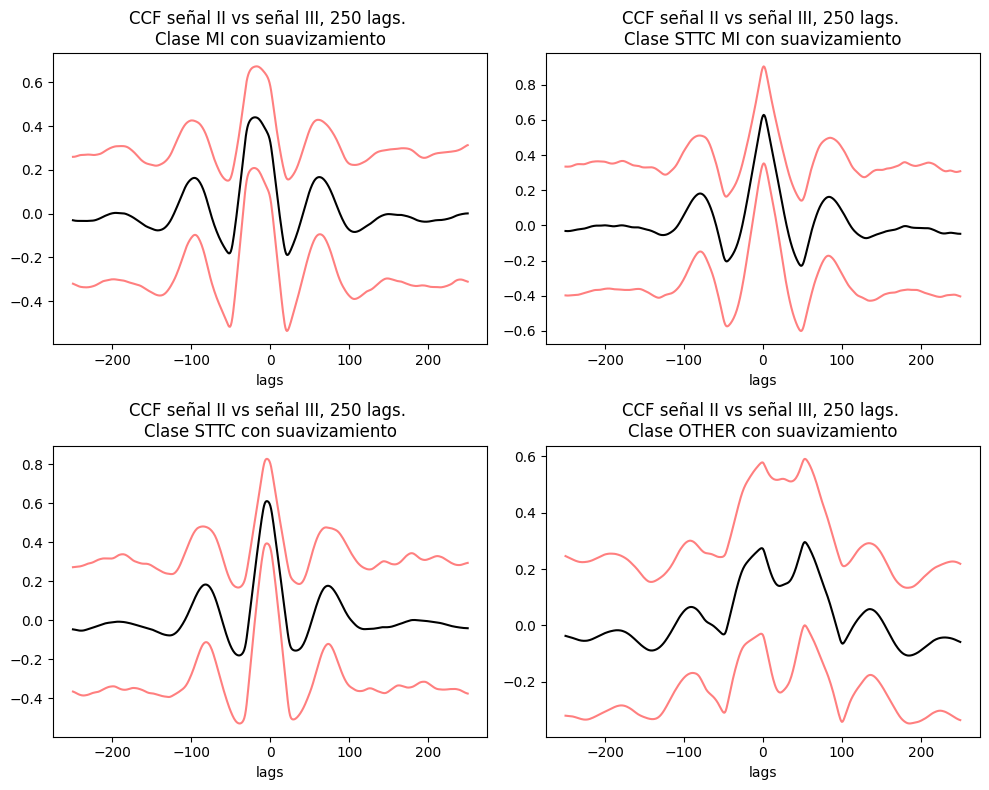

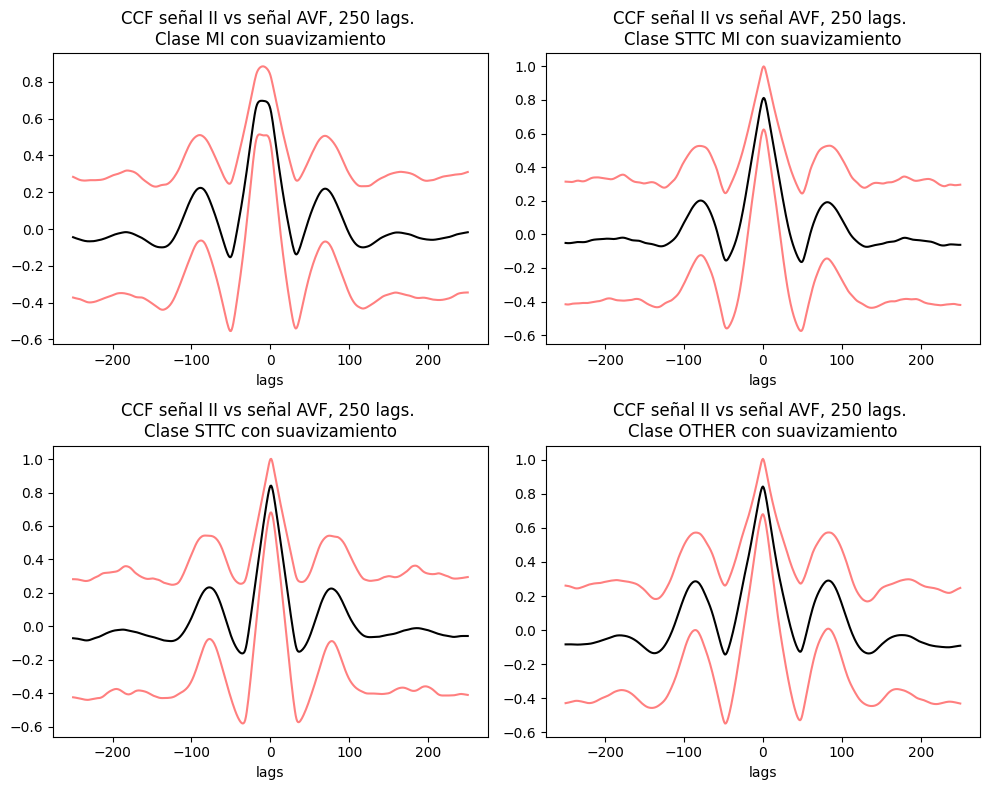

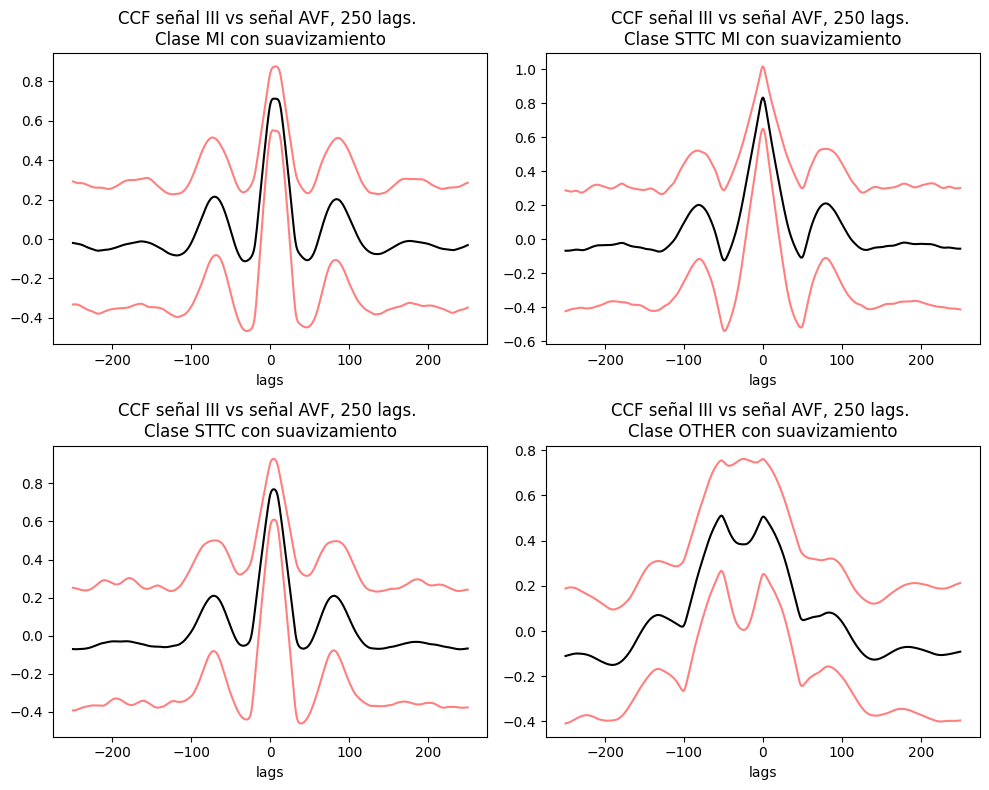

In [32]:
plot_ccf_faces_stats(df_mi_smooth_ccf_part_ci,
                        df_sttc_mi_smooth_ccf_part_ci,
                        df_sttc_smooth_ccf_part_ci,
                        df_other_smooth_ccf_part_ci,
                   interior_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = True)

#### <a id = '3d3d4'> Análisis de series de Cara Sepal con ventana (window) particular </a>
[índice](#0)

In [33]:
df_mi_smooth_part = dict_apply_smooth(df_mi, list_signals, dict_window = dict_data_jump["MI"])
df_sttc_mi_smooth_part = dict_apply_smooth(df_sttc_mi, list_signals, dict_window = dict_data_jump['STTC MI'])
df_sttc_smooth_part = dict_apply_smooth(df_sttc, list_signals, dict_window = dict_data_jump['STTC'])
df_other_smooth_part = dict_apply_smooth(df_other, list_signals, dict_window = dict_data_jump['OTHER'])

df_mi_smooth_ccf_part_cs = genera_dict_comb_ccf(df_mi_smooth_part, sepal_combinaciones)
df_sttc_mi_smooth_ccf_part_cs = genera_dict_comb_ccf(df_sttc_mi_smooth_part, sepal_combinaciones)
df_sttc_smooth_ccf_part_cs = genera_dict_comb_ccf(df_sttc_smooth_part, sepal_combinaciones)
df_other_smooth_ccf_part_cs = genera_dict_comb_ccf(df_other_smooth_part, sepal_combinaciones)

df_mi_smooth_stats_part_cs = get_estadistica_dict(df_mi_smooth_part, cara_sepal)
df_sttc_mi_smooth_stats_part_cs = get_estadistica_dict(df_sttc_mi_smooth_part, cara_sepal)
df_sttc_smooth_stats_part_cs = get_estadistica_dict(df_sttc_smooth_part, cara_sepal)
df_other_smooth_stats_part_cs = get_estadistica_dict(df_other_smooth_part, cara_sepal)

##### <a id = '3d3d4d1'>  Análisis de series con ventana (window) particular Cara Sepal </a>
[índice](#0)

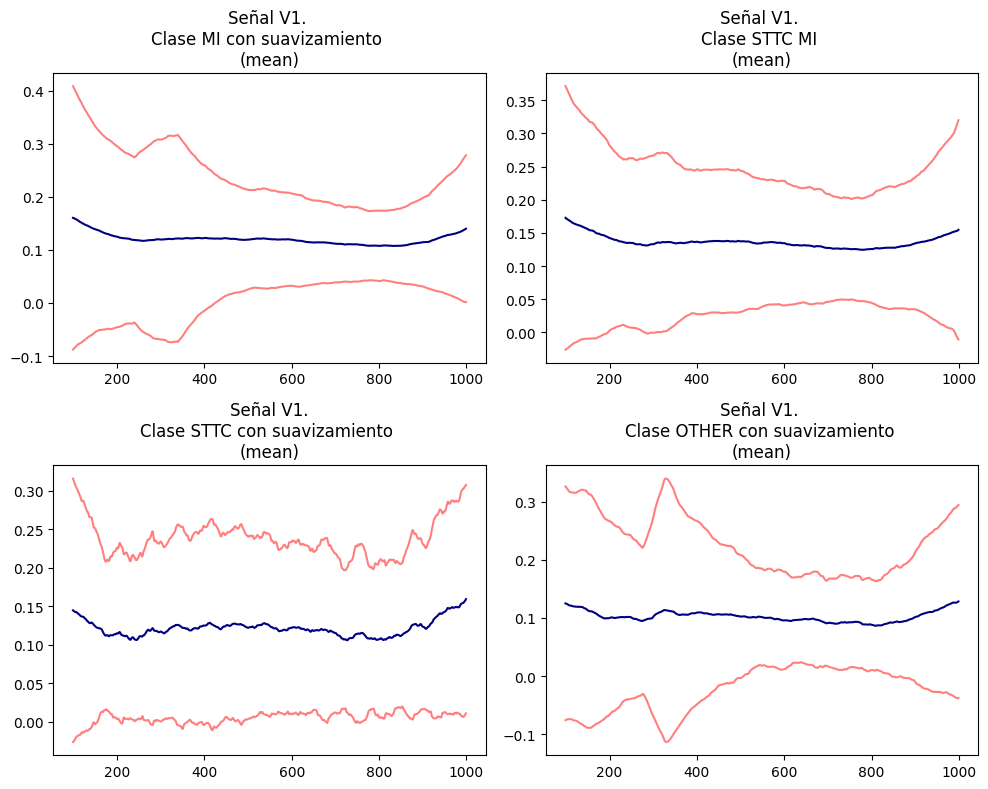

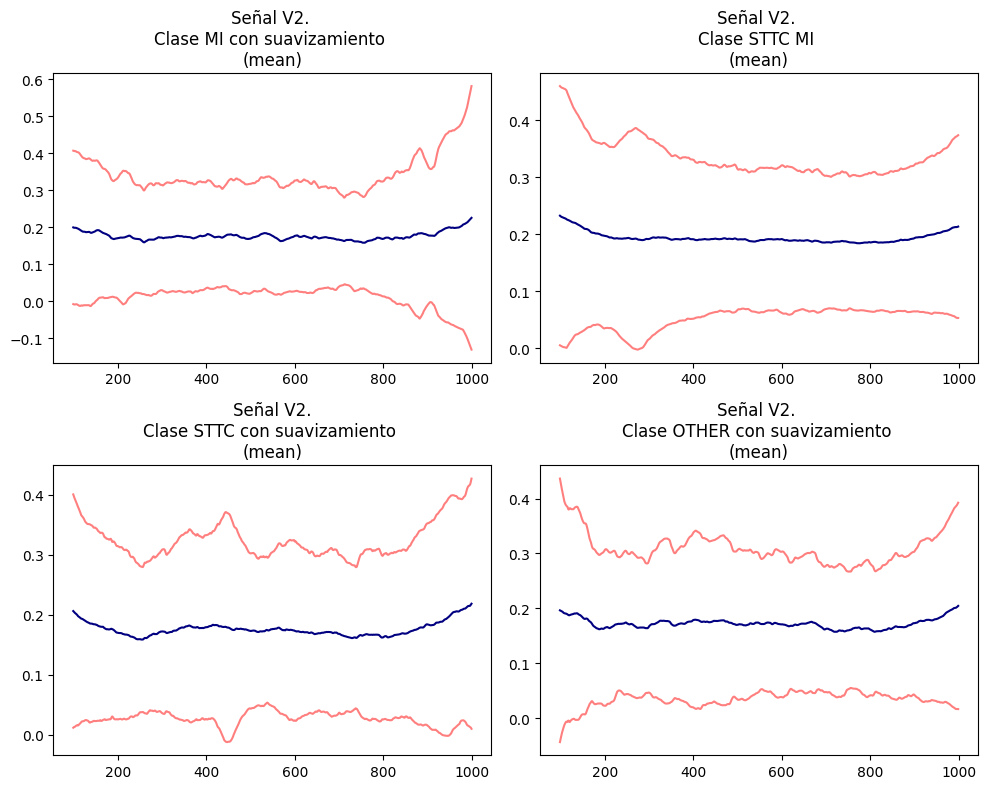

In [34]:
plot_signal_stats(df_mi_smooth_stats_part_cs, df_sttc_mi_smooth_stats_part_cs, df_sttc_smooth_stats_part_cs, df_other_smooth_stats_part_cs,
      cara_sepal, with_std=True, con_suavizamiento=True)

##### <a id = '3d3d4d2'>  Análisis de cross-correlation con ventana (window) particular Cara Sepal </a>
[índice](#0)

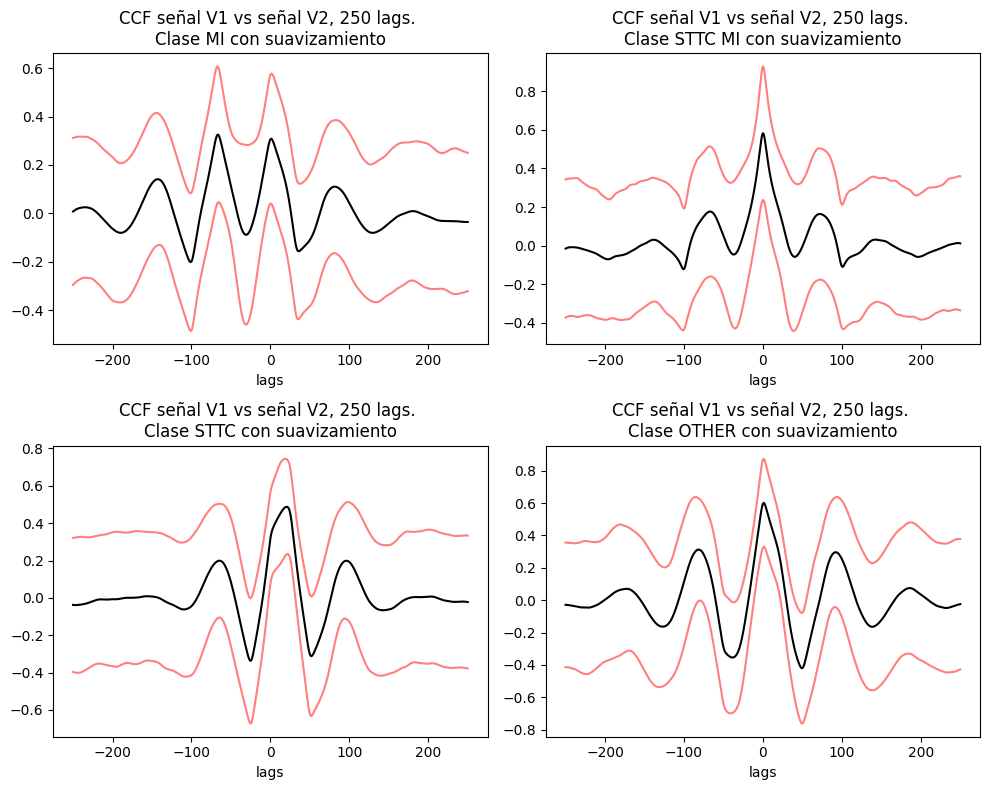

In [35]:
plot_ccf_faces_stats(df_mi_smooth_ccf_part_cs,
                        df_sttc_mi_smooth_ccf_part_cs,
                        df_sttc_smooth_ccf_part_cs,
                        df_other_smooth_ccf_part_cs,
                   sepal_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = True)

### <a id = '3d4'> Análisis de cross-correlation con ventana (window) promedio </a>
[índice](#0)

#### <a id = '3d4d1'> Análisis de series de Cara Lateral con ventana (window) de promedio</a>
[índice](#0)

In [36]:
df_mi_smooth_mean = dict_apply_smooth(df_mi, list_signals, dict_window = dict_data_jump["promedio"])
df_sttc_mi_smooth_mean = dict_apply_smooth(df_sttc_mi, list_signals, dict_window = dict_data_jump['promedio'])
df_sttc_smooth_mean = dict_apply_smooth(df_sttc, list_signals, dict_window = dict_data_jump['promedio'])
df_other_smooth_mean = dict_apply_smooth(df_other, list_signals, dict_window = dict_data_jump['promedio'])

df_mi_smooth_ccf_mean_cl = genera_dict_comb_ccf(df_mi_smooth_mean, lateral_combinaciones)
df_sttc_mi_smooth_ccf_mean_cl = genera_dict_comb_ccf(df_sttc_mi_smooth_mean, lateral_combinaciones)
df_sttc_smooth_ccf_mean_cl = genera_dict_comb_ccf(df_sttc_smooth_mean, lateral_combinaciones)
df_other_smooth_ccf_mean_cl = genera_dict_comb_ccf(df_other_smooth_mean, lateral_combinaciones)

df_mi_smooth_stats_mean_cl = get_estadistica_dict(df_mi_smooth_mean, cara_lateral)
df_sttc_mi_smooth_stats_mean_cl = get_estadistica_dict(df_sttc_mi_smooth_mean, cara_lateral)
df_sttc_smooth_stats_mean_cl = get_estadistica_dict(df_sttc_smooth_mean, cara_lateral)
df_other_smooth_stats_mean_cl = get_estadistica_dict(df_other_smooth_mean, cara_lateral)

##### <a id = '3d4d1d1'>  Análisis de series con ventana (window) promedio Cara Lateral </a>
[índice](#0)

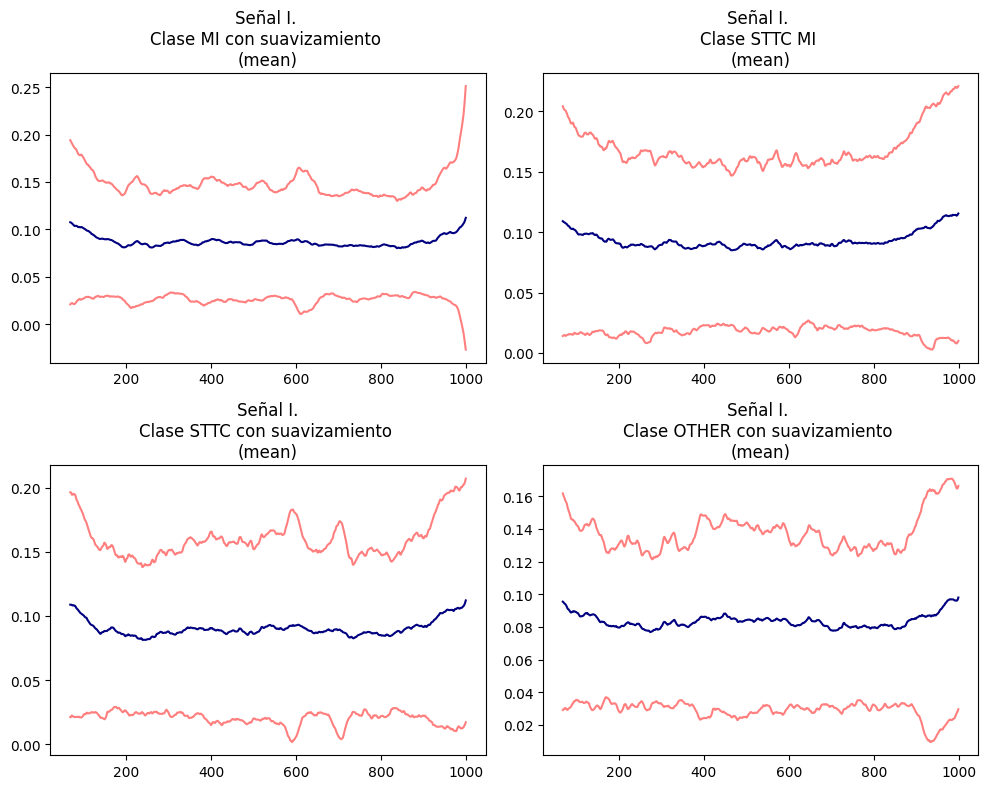

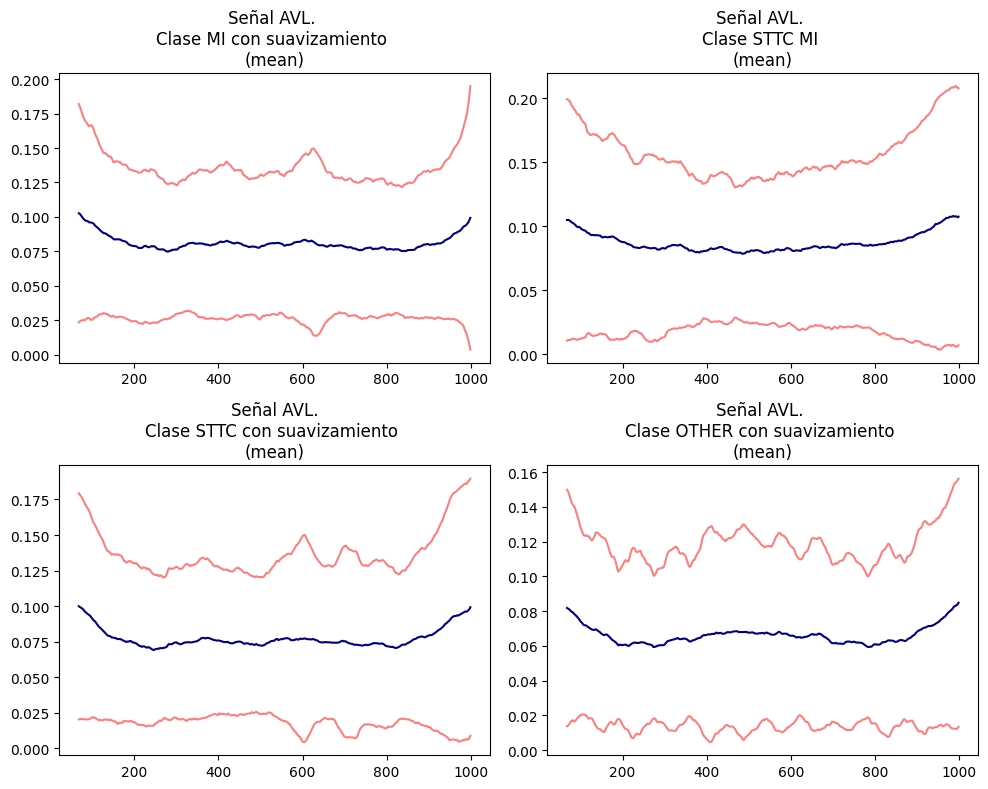

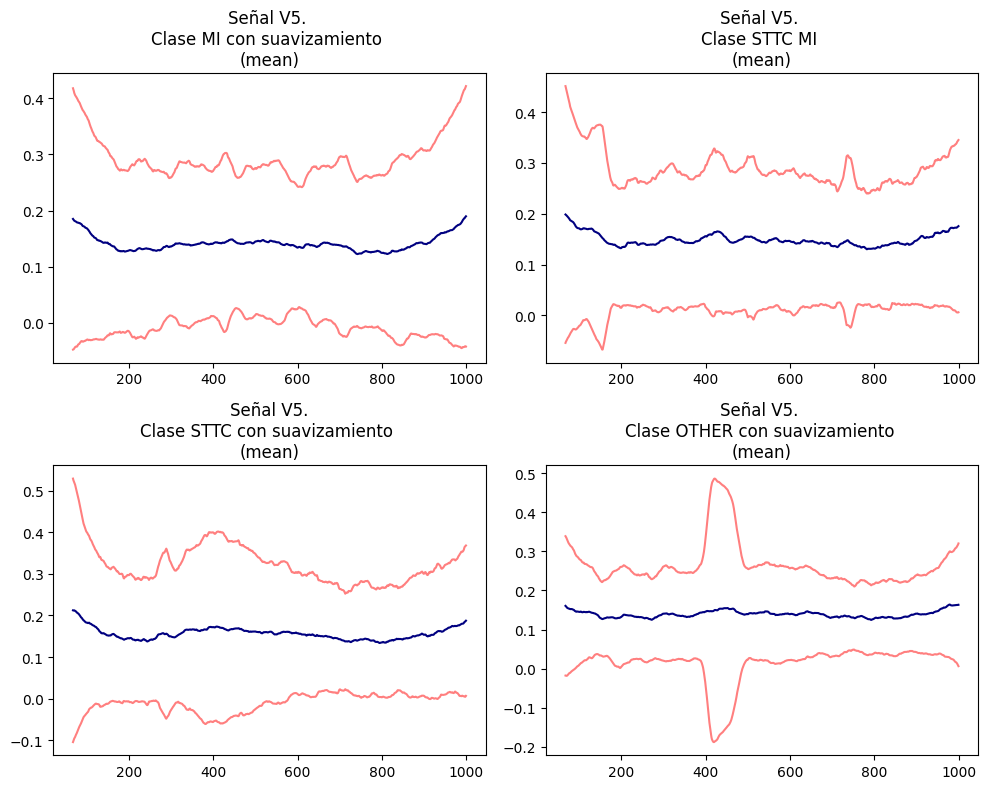

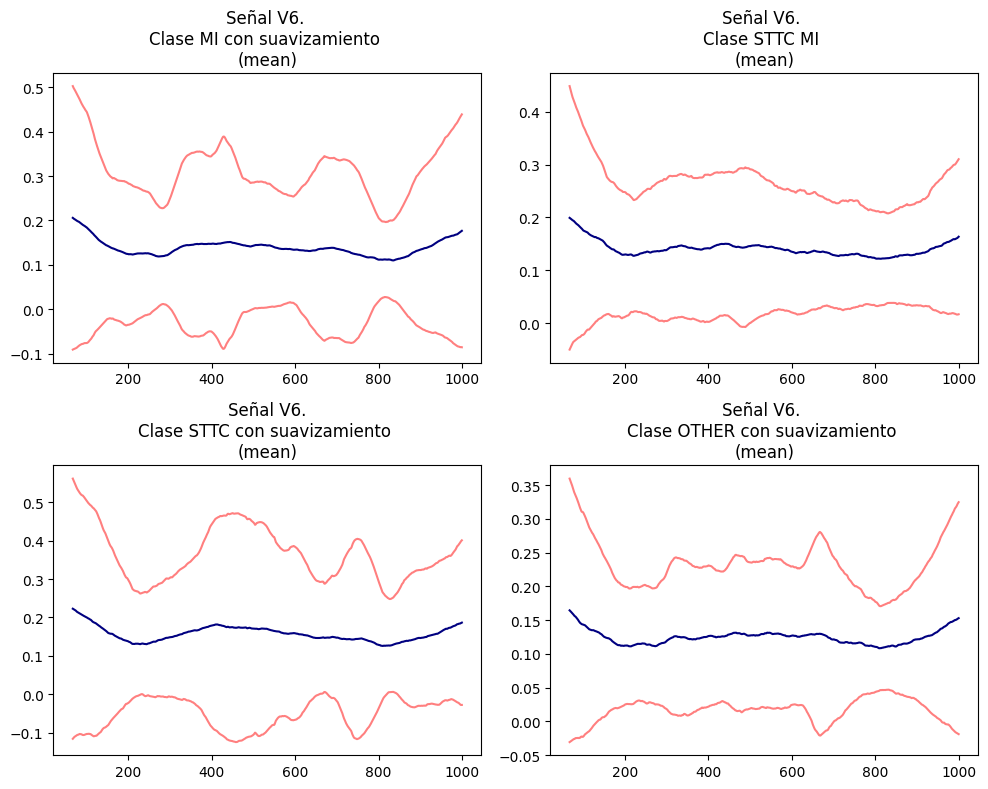

In [37]:
plot_signal_stats(df_mi_smooth_stats_mean_cl, df_sttc_mi_smooth_stats_mean_cl, df_sttc_smooth_stats_mean_cl, df_other_smooth_stats_mean_cl,
      cara_lateral, with_std=True, con_suavizamiento=True)

##### <a id = '3d4d1d2'>  Análisis de cross-correlation con ventana (window) promedio Cara Lateral </a>
[índice](#0)

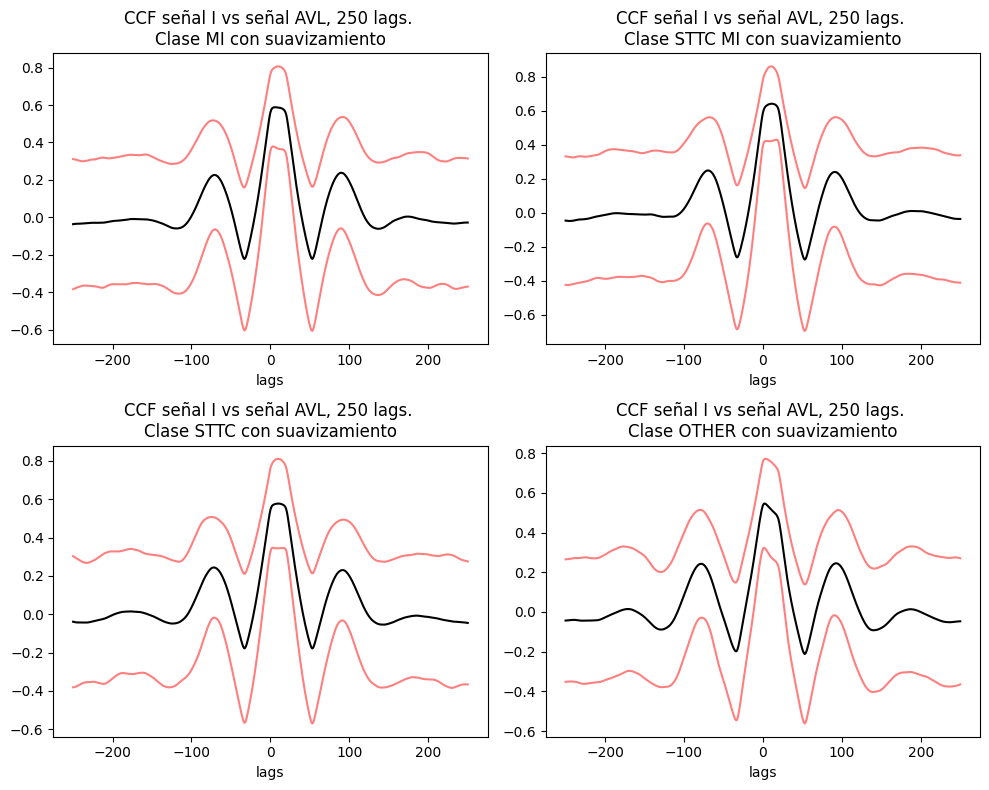

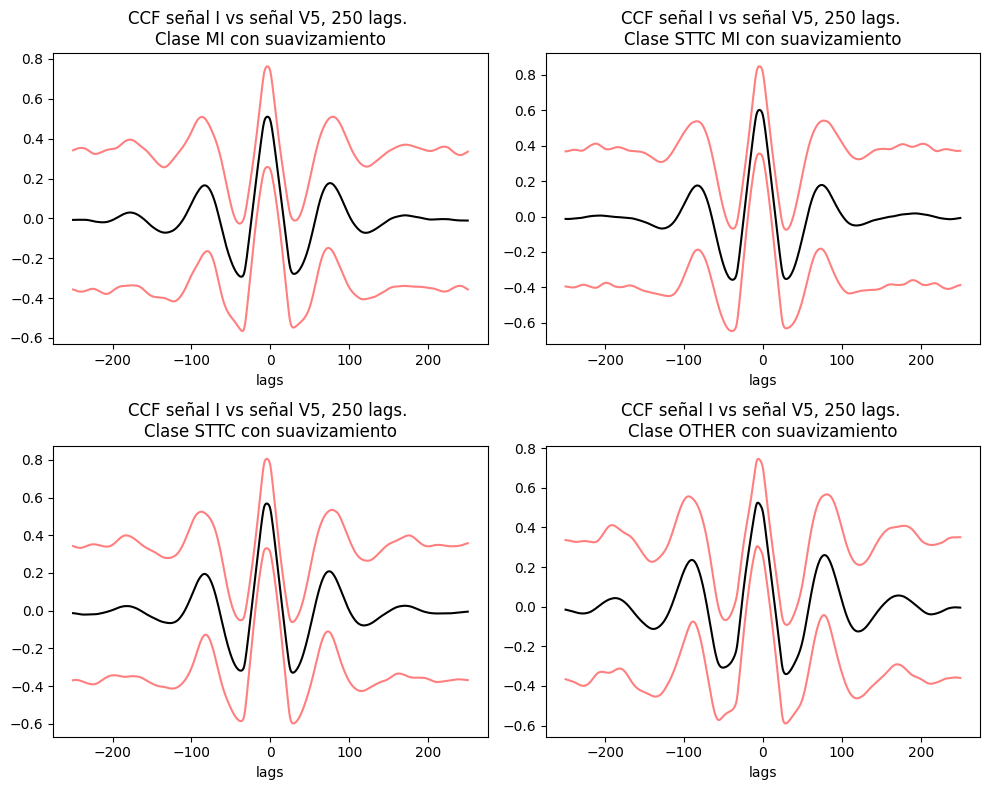

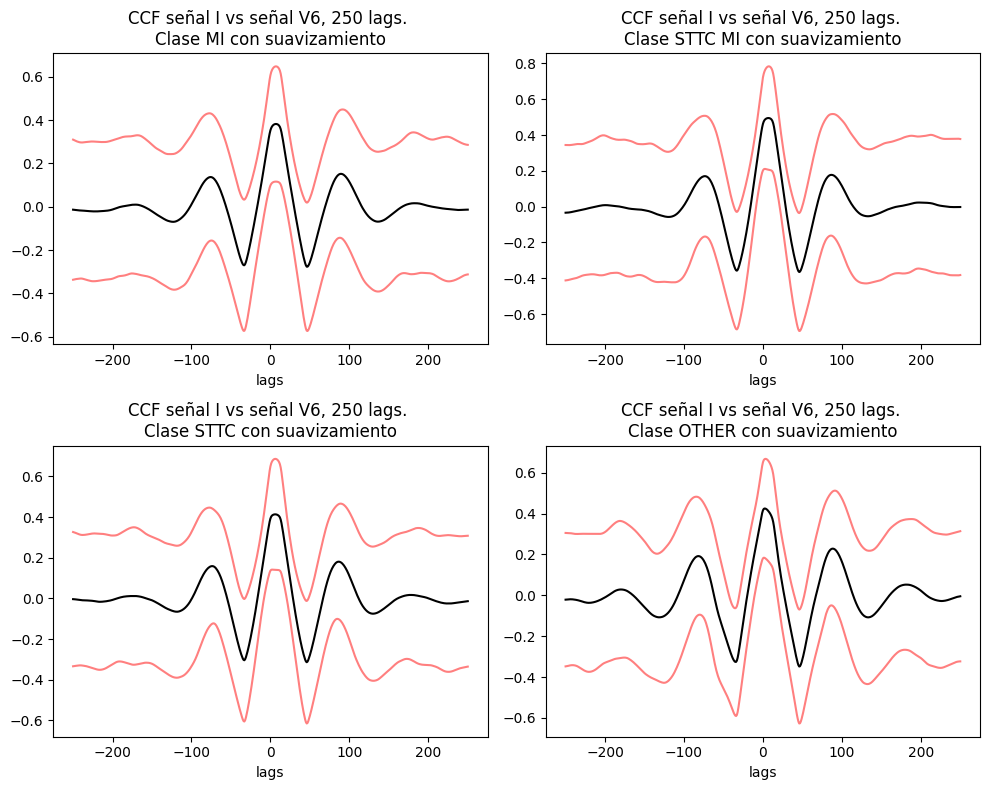

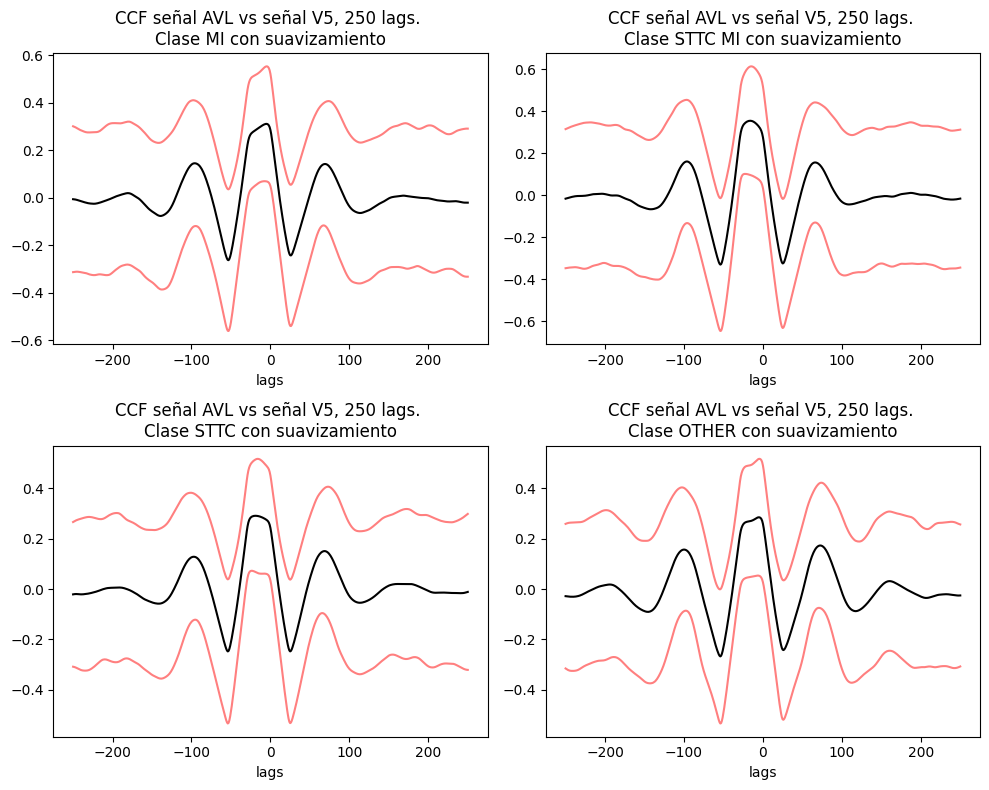

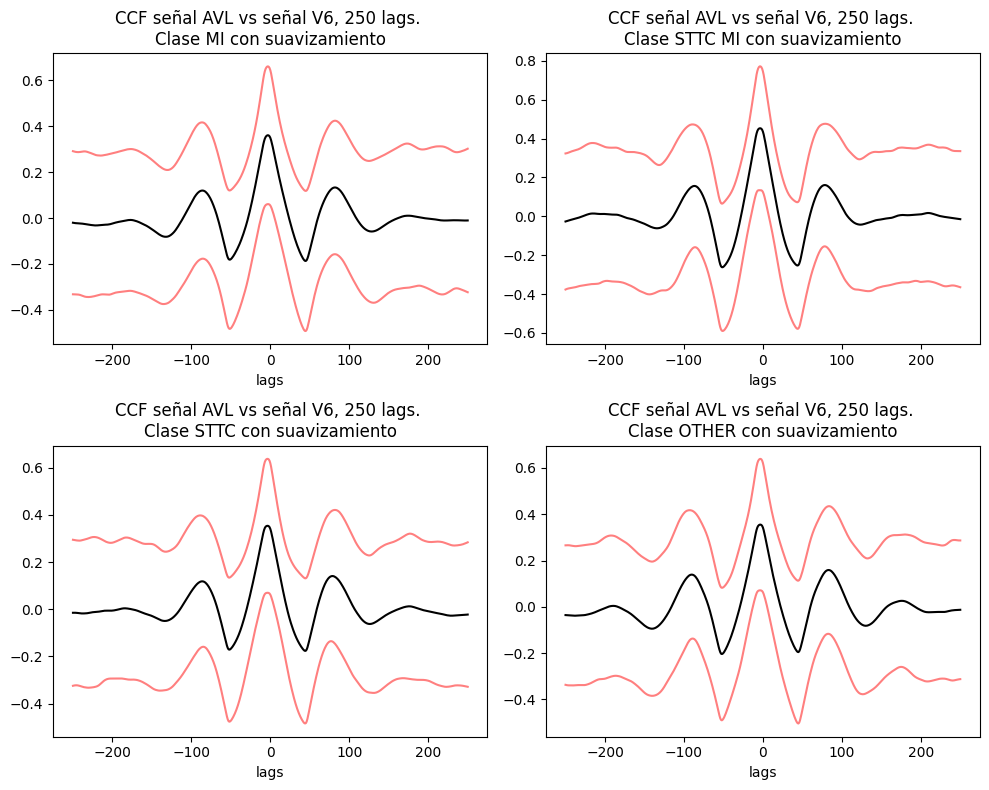

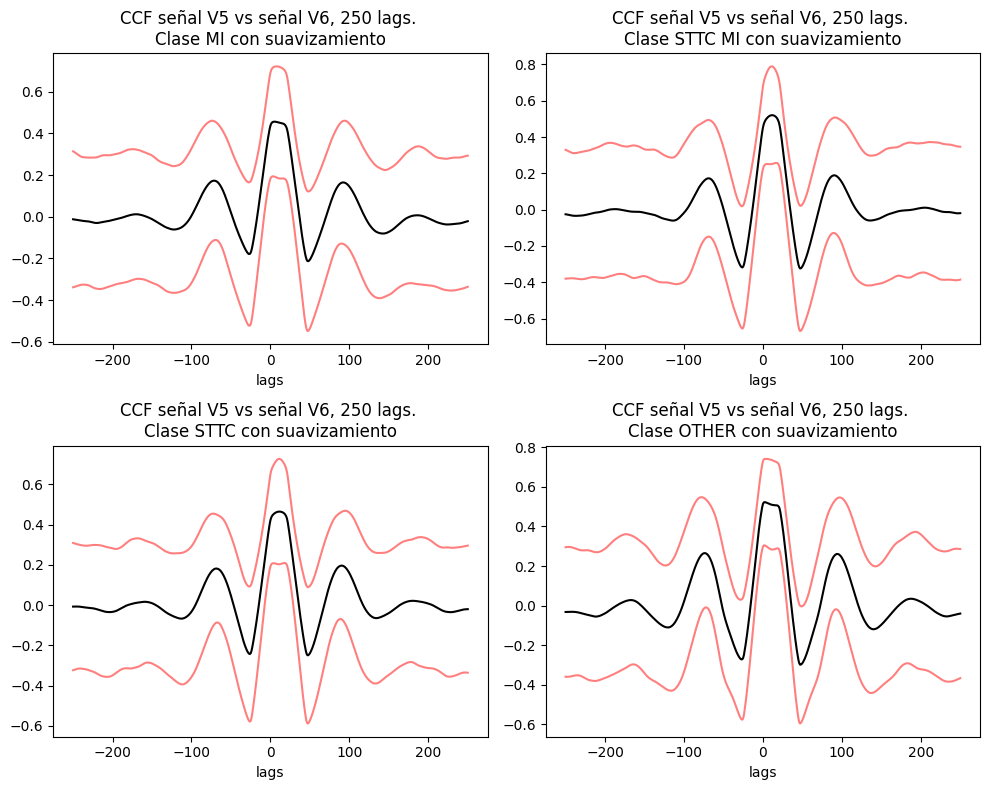

In [38]:
plot_ccf_faces_stats(df_mi_smooth_ccf_mean_cl,
                        df_sttc_mi_smooth_ccf_mean_cl,
                        df_sttc_smooth_ccf_mean_cl,
                        df_other_smooth_ccf_mean_cl,
                   lateral_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = True)

#### <a id = '3d4d2'> Análisis de series de Cara Anterior con ventana (window) de promedio </a>
[índice](#0)

In [39]:
df_mi_smooth_mean = dict_apply_smooth(df_mi, list_signals, dict_window = dict_data_jump["promedio"])
df_sttc_mi_smooth_mean = dict_apply_smooth(df_sttc_mi, list_signals, dict_window = dict_data_jump['promedio'])
df_sttc_smooth_mean = dict_apply_smooth(df_sttc, list_signals, dict_window = dict_data_jump['promedio'])
df_other_smooth_mean = dict_apply_smooth(df_other, list_signals, dict_window = dict_data_jump['promedio'])

df_mi_smooth_ccf_mean_ca = genera_dict_comb_ccf(df_mi_smooth_mean, anterior_combinaciones)
df_sttc_mi_smooth_ccf_mean_ca = genera_dict_comb_ccf(df_sttc_mi_smooth_mean, anterior_combinaciones)
df_sttc_smooth_ccf_mean_ca = genera_dict_comb_ccf(df_sttc_smooth_mean, anterior_combinaciones)
df_other_smooth_ccf_mean_ca = genera_dict_comb_ccf(df_other_smooth_mean, anterior_combinaciones)

df_mi_smooth_stats_mean_ca = get_estadistica_dict(df_mi_smooth_mean, cara_anterior)
df_sttc_mi_smooth_stats_mean_ca = get_estadistica_dict(df_sttc_mi_smooth_mean, cara_anterior)
df_sttc_smooth_stats_mean_ca = get_estadistica_dict(df_sttc_smooth_mean, cara_anterior)
df_other_smooth_stats_mean_ca = get_estadistica_dict(df_other_smooth_mean, cara_anterior)

##### <a id = '3d4d2d1'>  Análisis de series con ventana (window) promedio Cara Anterior </a>
[índice](#0)

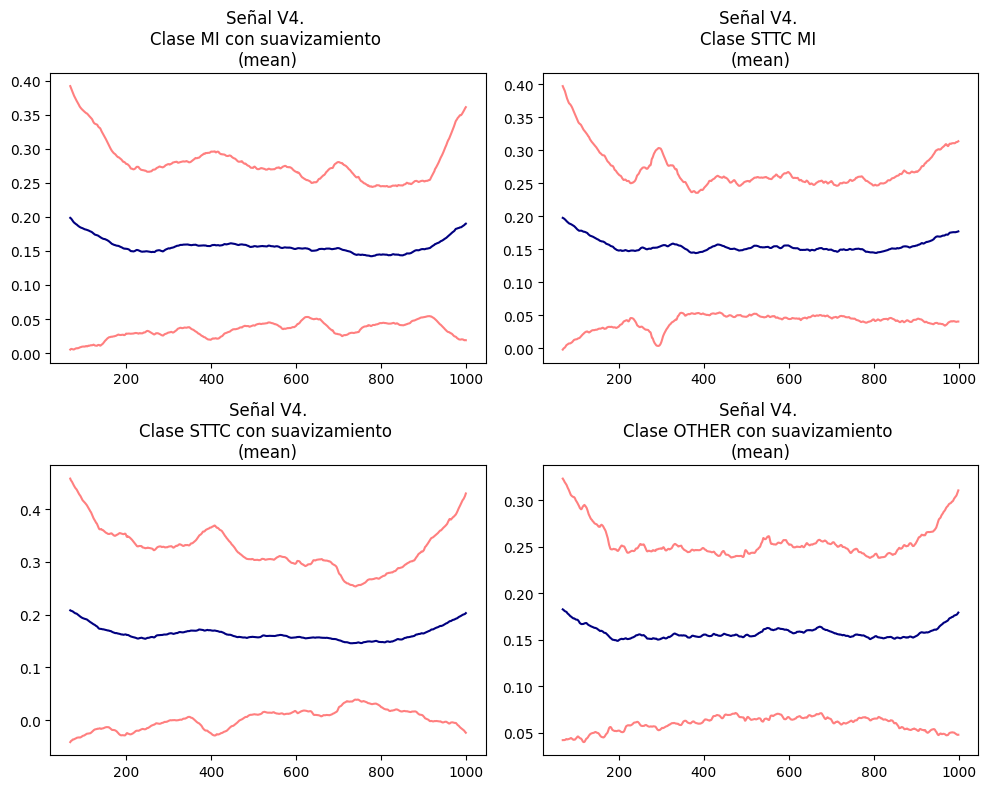

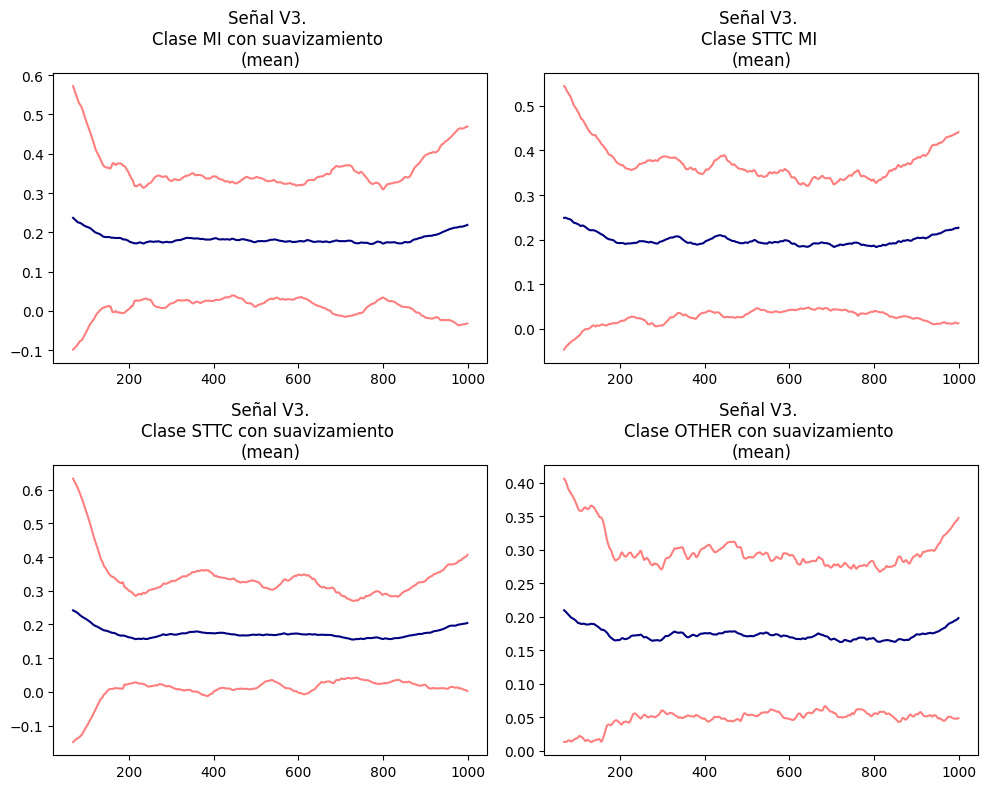

In [40]:
plot_signal_stats(df_mi_smooth_stats_mean_ca, df_sttc_mi_smooth_stats_mean_ca, df_sttc_smooth_stats_mean_ca, df_other_smooth_stats_mean_ca,
      cara_anterior, with_std=True, con_suavizamiento=True)

##### <a id = '3d4d2d1'>  Análisis de cross-correlation con ventana (window) promedio Cara Anterior </a>
[índice](#0)

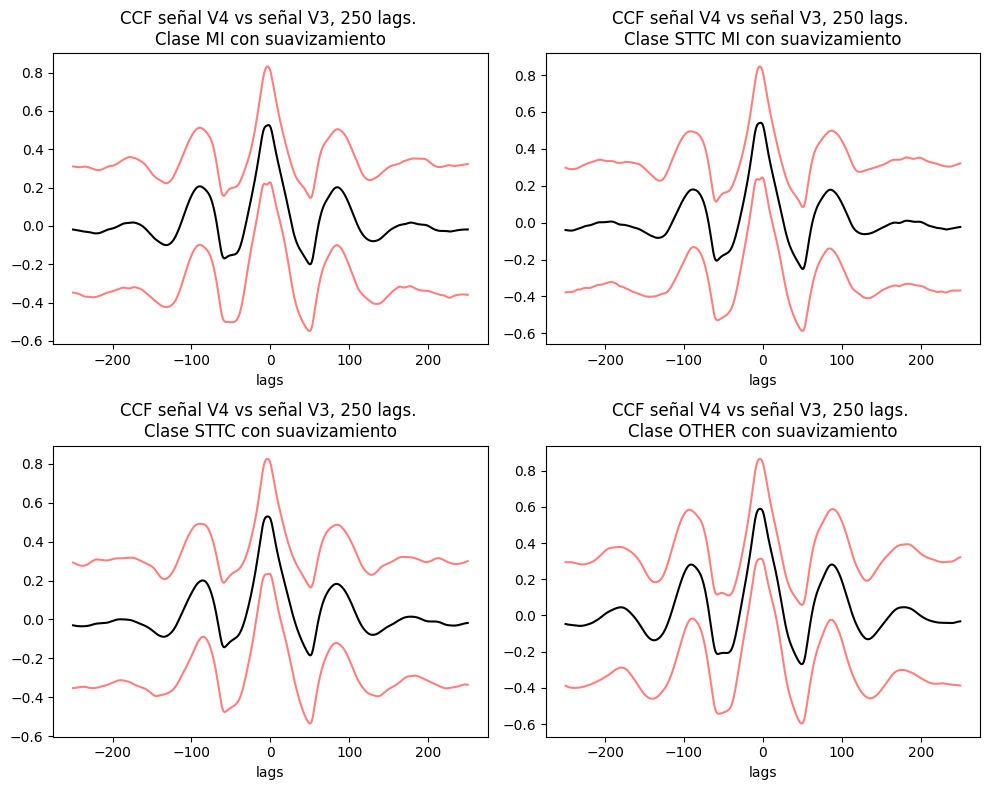

In [41]:
plot_ccf_faces_stats(df_mi_smooth_ccf_mean_ca,
                        df_sttc_mi_smooth_ccf_mean_ca,
                        df_sttc_smooth_ccf_mean_ca,
                        df_other_smooth_ccf_mean_ca,
                   anterior_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = True)

#### <a id = '3d4d3'> Análisis de series de Cara Interior con ventana (window) de promedio </a>
[índice](#0)

In [42]:
df_mi_smooth_mean = dict_apply_smooth(df_mi, list_signals, dict_window = dict_data_jump["promedio"])
df_sttc_mi_smooth_mean = dict_apply_smooth(df_sttc_mi, list_signals, dict_window = dict_data_jump['promedio'])
df_sttc_smooth_mean = dict_apply_smooth(df_sttc, list_signals, dict_window = dict_data_jump['promedio'])
df_other_smooth_mean = dict_apply_smooth(df_other, list_signals, dict_window = dict_data_jump['promedio'])

df_mi_smooth_ccf_mean_ci = genera_dict_comb_ccf(df_mi_smooth_mean, interior_combinaciones)
df_sttc_mi_smooth_ccf_mean_ci = genera_dict_comb_ccf(df_sttc_mi_smooth_mean, interior_combinaciones)
df_sttc_smooth_ccf_mean_ci = genera_dict_comb_ccf(df_sttc_smooth_mean, interior_combinaciones)
df_other_smooth_ccf_mean_ci = genera_dict_comb_ccf(df_other_smooth_mean, interior_combinaciones)

df_mi_smooth_stats_mean_ci = get_estadistica_dict(df_mi_smooth_mean, cara_interior)
df_sttc_mi_smooth_stats_mean_ci = get_estadistica_dict(df_sttc_mi_smooth_mean, cara_interior)
df_sttc_smooth_stats_mean_ci = get_estadistica_dict(df_sttc_smooth_mean, cara_interior)
df_other_smooth_stats_mean_ci = get_estadistica_dict(df_other_smooth_mean, cara_interior)

##### <a id = '3d4d3d1'>  Análisis de series con ventana (window) promedio Cara Interior </a>
[índice](#0)

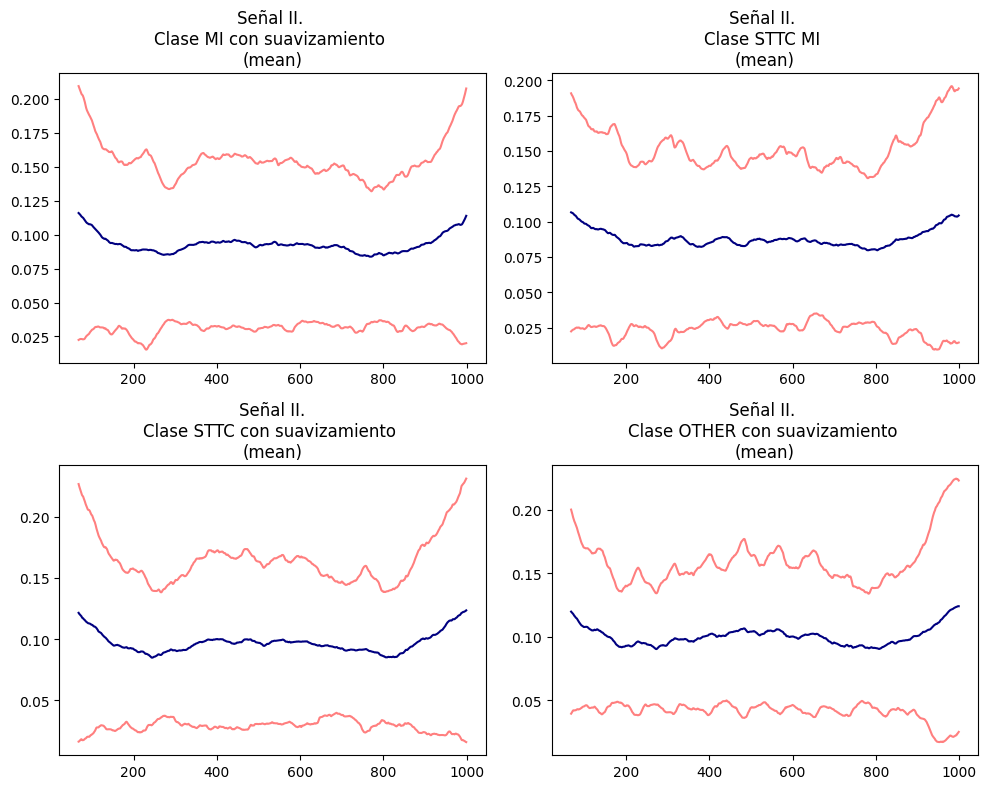

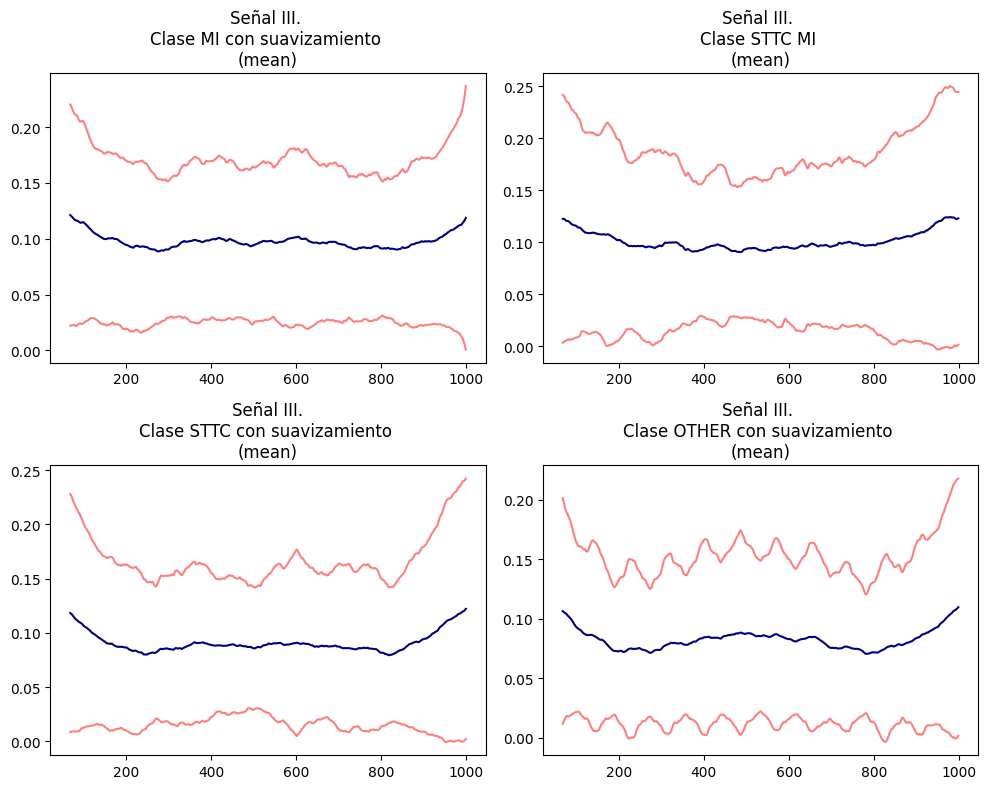

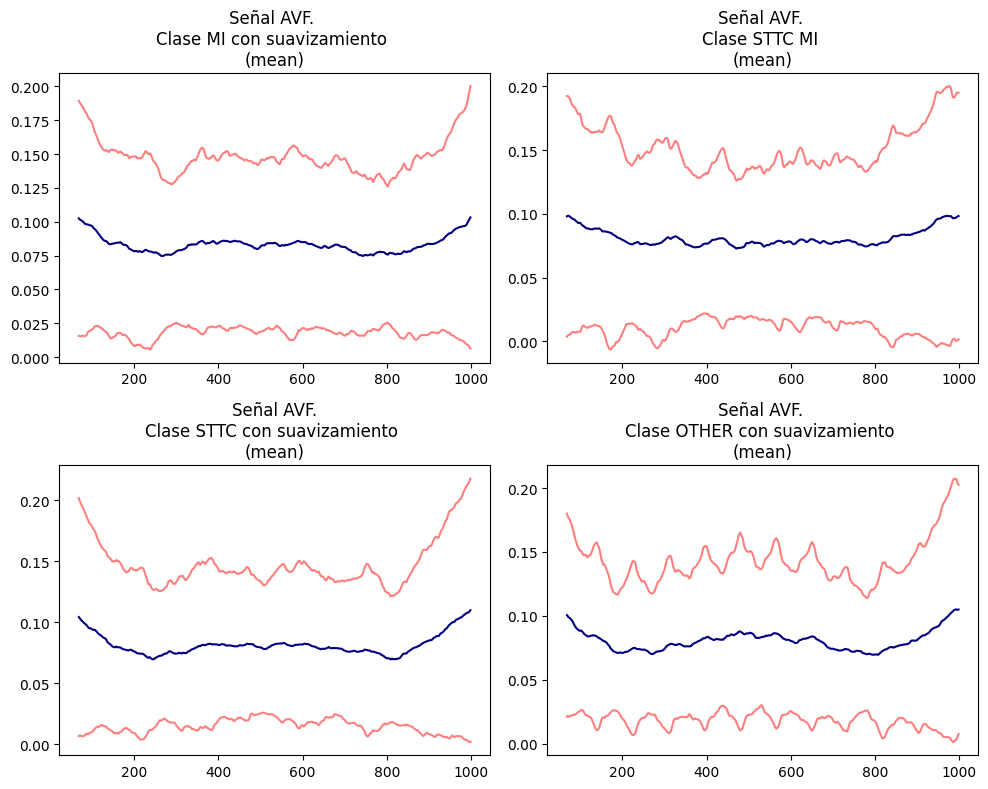

In [43]:
plot_signal_stats(df_mi_smooth_stats_mean_ci, df_sttc_mi_smooth_stats_mean_ci, df_sttc_smooth_stats_mean_ci, df_other_smooth_stats_mean_ci,
      cara_interior, with_std=True, con_suavizamiento=True)

##### <a id = '3d4d3d2'>  Análisis de cross-correlation con ventana (window) promedio Cara Interior </a>
[índice](#0)

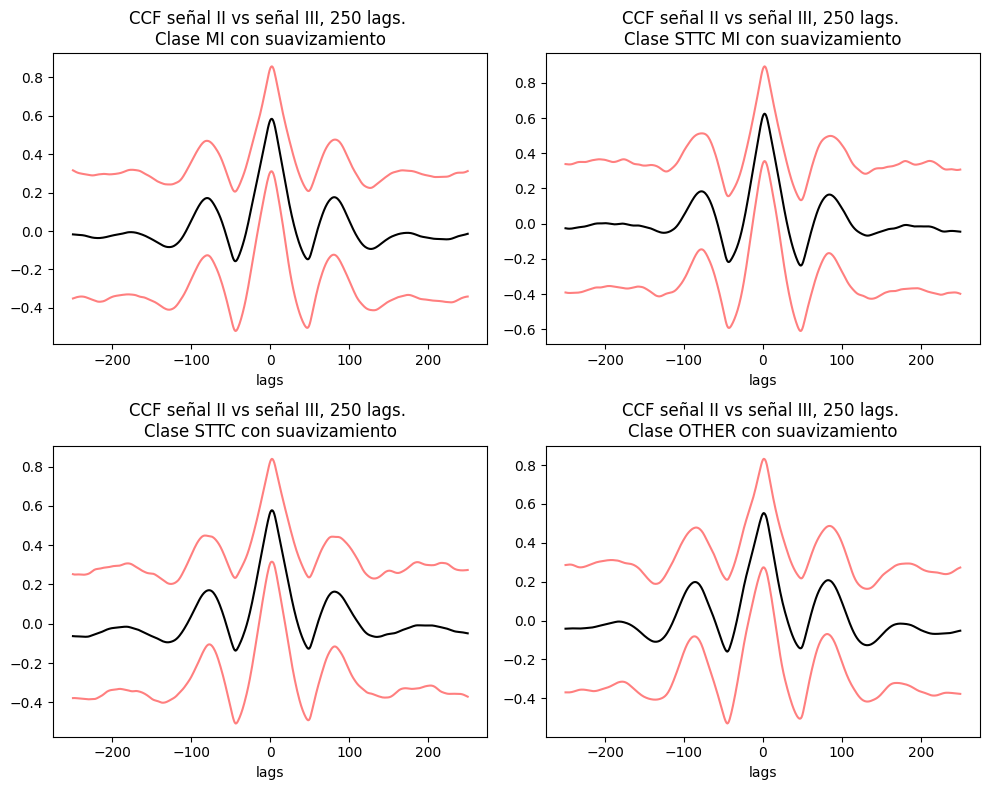

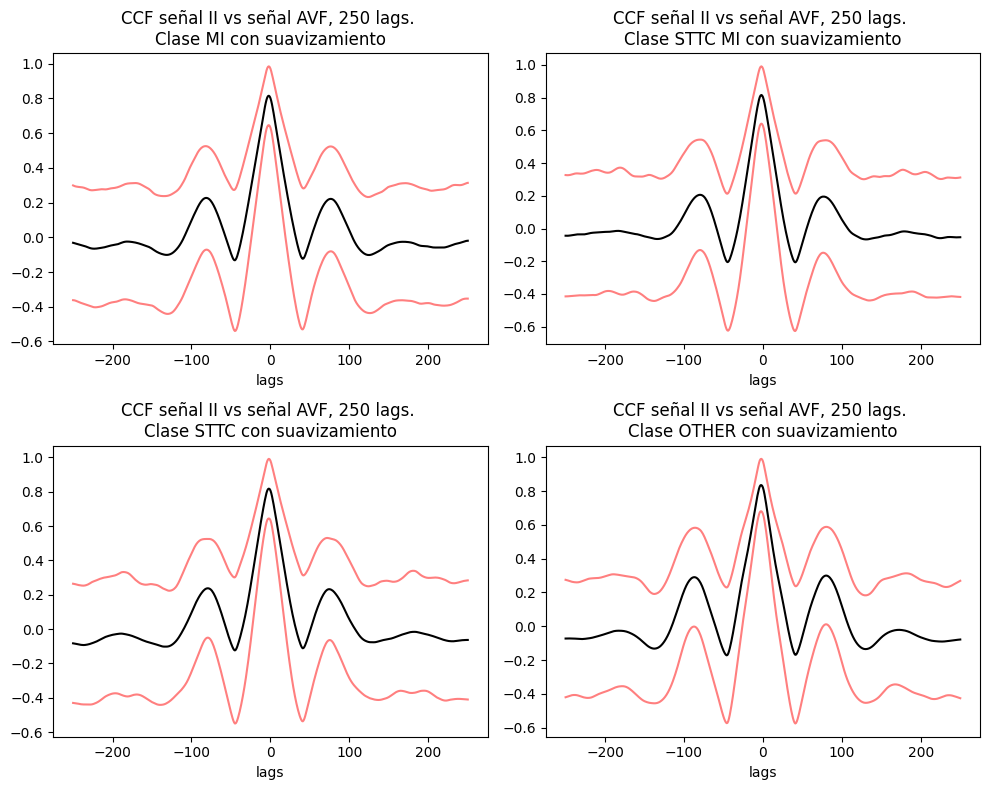

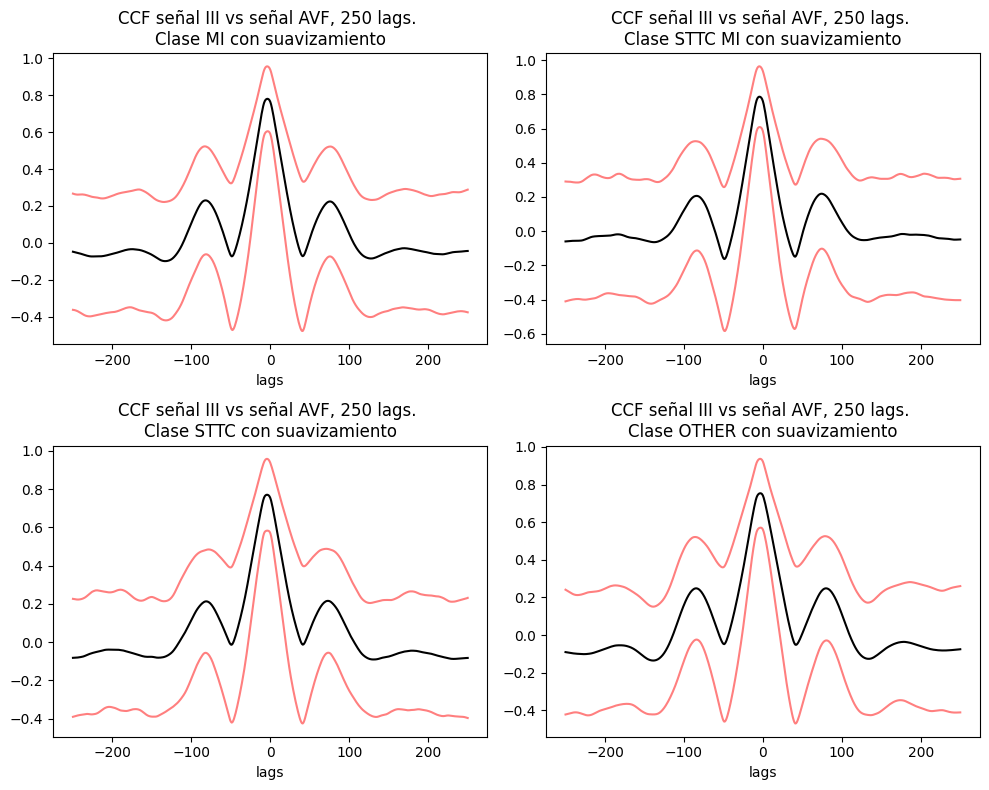

In [44]:
plot_ccf_faces_stats(df_mi_smooth_ccf_mean_ci,
                        df_sttc_mi_smooth_ccf_mean_ci,
                        df_sttc_smooth_ccf_mean_ci,
                        df_other_smooth_ccf_mean_ci,
                   interior_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = True)

#### <a id = '3d4d4'> Análisis de series de Cara Sepal con ventana (window) de promedio </a>
[índice](#0)

In [45]:
df_mi_smooth_mean = dict_apply_smooth(df_mi, list_signals, dict_window = dict_data_jump["promedio"])
df_sttc_mi_smooth_mean = dict_apply_smooth(df_sttc_mi, list_signals, dict_window = dict_data_jump['promedio'])
df_sttc_smooth_mean = dict_apply_smooth(df_sttc, list_signals, dict_window = dict_data_jump['promedio'])
df_other_smooth_mean = dict_apply_smooth(df_other, list_signals, dict_window = dict_data_jump['promedio'])

df_mi_smooth_ccf_mean_cs = genera_dict_comb_ccf(df_mi_smooth_mean, sepal_combinaciones)
df_sttc_mi_smooth_ccf_mean_cs = genera_dict_comb_ccf(df_sttc_mi_smooth_mean, sepal_combinaciones)
df_sttc_smooth_ccf_mean_cs = genera_dict_comb_ccf(df_sttc_smooth_mean, sepal_combinaciones)
df_other_smooth_ccf_mean_cs = genera_dict_comb_ccf(df_other_smooth_mean, sepal_combinaciones)

df_mi_smooth_stats_mean_cs = get_estadistica_dict(df_mi_smooth_mean, cara_sepal)
df_sttc_mi_smooth_stats_mean_cs = get_estadistica_dict(df_sttc_mi_smooth_mean, cara_sepal)
df_sttc_smooth_stats_mean_cs = get_estadistica_dict(df_sttc_smooth_mean, cara_sepal)
df_other_smooth_stats_mean_cs = get_estadistica_dict(df_other_smooth_mean, cara_sepal)

##### <a id = '3d4d4d1'>  Análisis de series con ventana (window) promedio Cara Sepal </a>
[índice](#0)

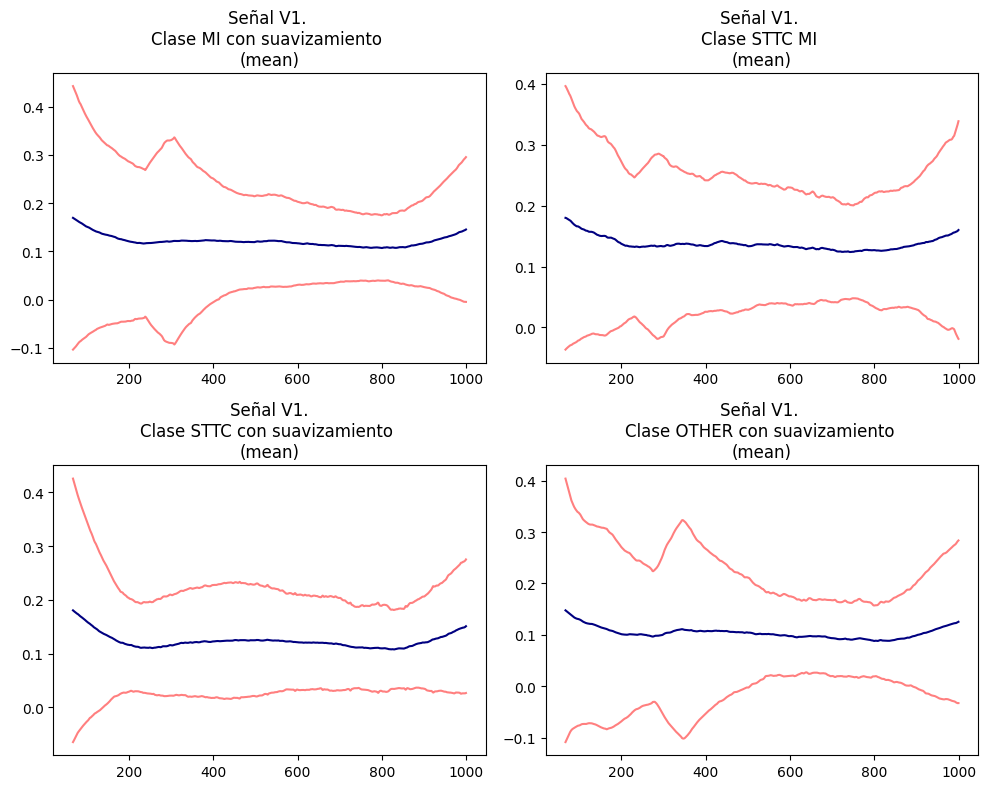

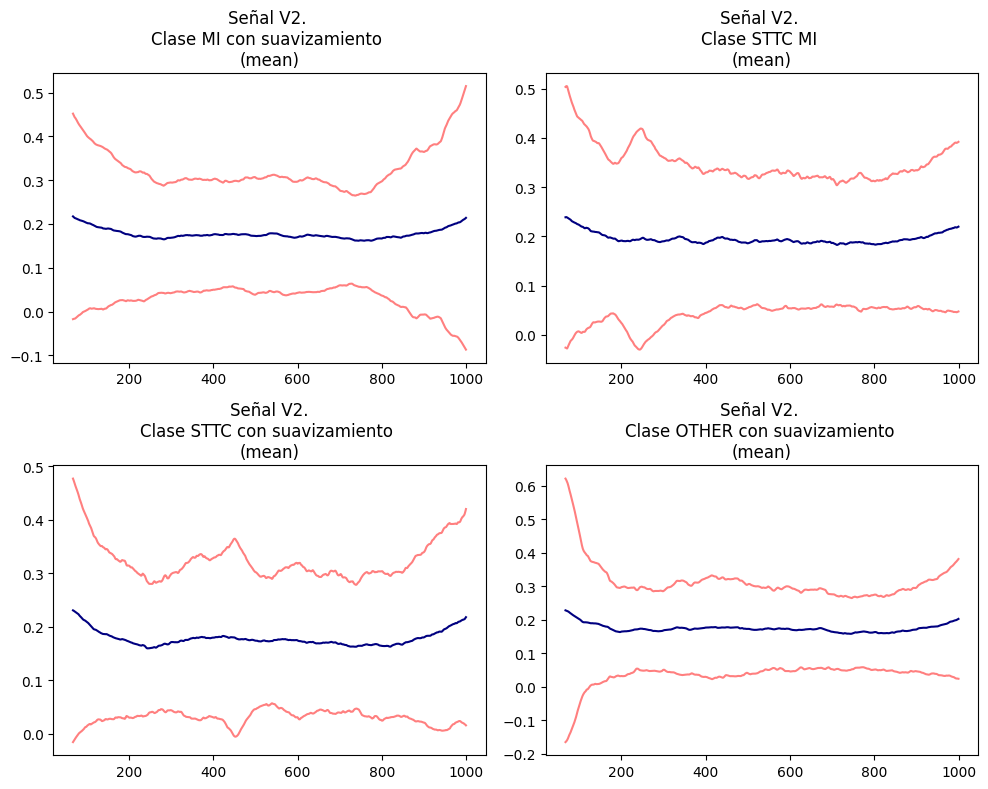

In [46]:
plot_signal_stats(df_mi_smooth_stats_mean_cs, df_sttc_mi_smooth_stats_mean_cs, df_sttc_smooth_stats_mean_cs, df_other_smooth_stats_mean_cs,
      cara_sepal, with_std=True, con_suavizamiento=True)

##### <a id = '3d4d4d2'>  Análisis de cross-correlation con ventana (window) promedio Cara Sepal </a>
[índice](#0)

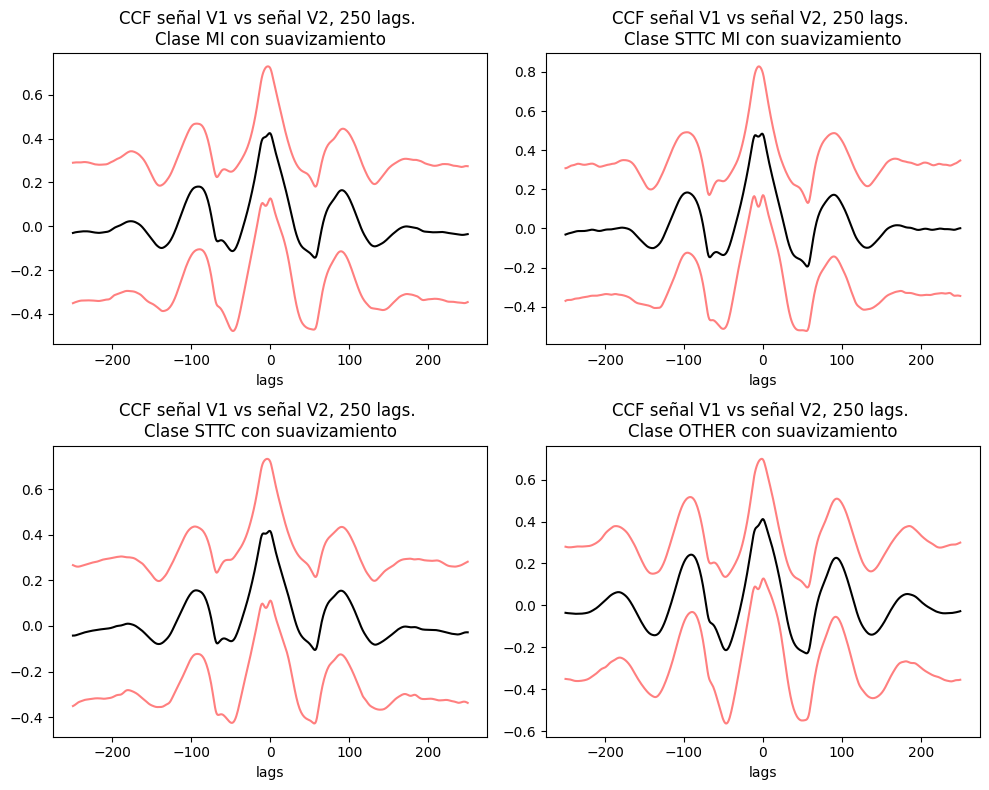

In [47]:
plot_ccf_faces_stats(df_mi_smooth_ccf_mean_cs,
                        df_sttc_mi_smooth_ccf_mean_cs,
                        df_sttc_smooth_ccf_mean_cs,
                        df_other_smooth_ccf_mean_cs,
                   sepal_combinaciones,
                   status = True,
                   series = False,
                   x_lags = [],
                   con_suavizamiento = True)